In [ ]:
!nvidia-smi


Fri May 19 08:55:02 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100-SXM...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   30C    P0    48W / 400W |      0MiB / 40960MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# **Dataset Loading:**
Importing dataset from Google Drive and extracting the zipped file.

In [ ]:
!pip install --upgrade --no-cache-dir gdown
!gdown 1DArAhv1ieTdmvmu0Up8_2u5j4iVgmqn7

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Attempting uninstall: gdown
    Found existing installation: gdown 4.6.6
    Uninstalling gdown-4.6.6:
      Successfully uninstalled gdown-4.6.6
Downloading...
From (uriginal): https://drive.google.com/uc?id=1DArAhv1ieTdmvmu0Up8_2u5j4iVgmqn7
From (redirected): https://drive.google.com/uc?id=1DArAhv1ieTdmvmu0Up8_2u5j4iVgmqn7&confirm=t&uuid=25202073-6035-4805-b435-4e230b41e318
To: /content/archive.zip
100% 1.11G/1.11G [00:12<00:00, 86.1MB/s]


In [ ]:
!mkdir Dataset
!unzip /content/archive.zip -d Dataset/


Streaming output truncated to the last 5000 lines.
  inflating: Dataset/Images/2844846111_8c1cbfc75d.jpg  
  inflating: Dataset/Images/2844963839_ff09cdb81f.jpg  
  inflating: Dataset/Images/2845246160_d0d1bbd6f0.jpg  
  inflating: Dataset/Images/2845691057_d4ab89d889.jpg  
  inflating: Dataset/Images/2845845721_d0bc113ff7.jpg  
  inflating: Dataset/Images/2846037553_1a1de50709.jpg  
  inflating: Dataset/Images/2846785268_904c5fcf9f.jpg  
  inflating: Dataset/Images/2846843520_b0e6211478.jpg  
  inflating: Dataset/Images/2847514745_9a35493023.jpg  
  inflating: Dataset/Images/2847615962_c330bded6e.jpg  
  inflating: Dataset/Images/2847859796_4d9cb0d31f.jpg  
  inflating: Dataset/Images/2848266893_9693c66275.jpg  
  inflating: Dataset/Images/2848571082_26454cb981.jpg  
  inflating: Dataset/Images/2848895544_6d06210e9d.jpg  
  inflating: Dataset/Images/2848977044_446a31d86e.jpg  
  inflating: Dataset/Images/2849194983_2968c72832.jpg  
  inflating: Dataset/Images/2850719435_221f15e951.jpg

In [ ]:
# import shutil
# import os

# folder_path = "/content/Images"
# shutil.rmtree(folder_path)


# Prerequisites & Data Preprocessing:
- Importing libraries
- Load the data
- Generate the vocabulary
- Create a customized dataset
- Implement padding

In [ ]:
# Prerequisites
import os  # For operating system-related operations
import torch  # For deep learning framework
import torchvision.transforms as T  # For image transformations
import matplotlib.pyplot as plt  # For visualizations
import matplotlib.image as mpimg  # For working with images
from collections import Counter  # For counting elements in a collection
from torch.nn.utils.rnn import pad_sequence  # For padding sequences
from torch.utils.data import DataLoader, Dataset  # For creating data loaders and datasets
from nltk.tokenize import RegexpTokenizer  # For tokenizing text
from PIL import Image  # For working with images


## **Data Retrieval:**
Fetching file names for captions and images.

In [ ]:
%cd /content/Dataset

/content/Dataset


In [ ]:
import pandas as pd

# Set the path to the captions file
captions_path = 'captions.txt'

# Load the captions file into a pandas DataFrame
captions_df = pd.read_csv(captions_path)

# Count the number of images with captions
num_images = len(captions_df)

# Print the total number of images with captions
print(f"Total number of images with captions: {num_images}")

# Print the number of unique images
unique_images = len(captions_df['image'].unique())
print(f"Number of unique images with captions: {unique_images}")

# Print the number of unique captions
unique_captions = len(captions_df['caption'].unique())
print(f"Number of unique captions: {unique_captions}")

# Display the first 5 rows of the DataFrame
print("\nSample captions:")
captions_df.head()


Total number of images with captions: 40455
Number of unique images with captions: 8091
Number of unique captions: 40201

Sample captions:


,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...


## **Creating a Vocabulary**

In [ ]:
# Import the Vocabulary class
from nltk.tokenize import RegexpTokenizer

class Vocabulary:
  def __init__(self, frequency_threshold):
    # Special tokens and their corresponding indices
    self.itos = {0: "<PAD>", 1: "<SOS>", 2: "<EOS>", 3: "<UNK>"}
    self.stoi = {"<PAD>": 0, "<SOS>": 1, "<EOS>": 2, "<UNK>": 3}
    self.frequency_threshold = frequency_threshold


  def __len__(self):
    # Return the total number of tokens in the vocabulary
    return len(self.itos)

  def tokenizer(self, text):
    # Tokenize the text using a regular expression tokenizer
    tokenizer = RegexpTokenizer(r'\w+')
    return [token.lower() for token in tokenizer.tokenize(text)]
  
  def build_vocab(self, caption_list):
    frequencies = {}
    idx = 4

    # Iterate over each caption in the list
    for caption in caption_list:
      # Tokenize the caption
      for token in self.tokenizer(caption):
        # Update the token frequencies
        if token not in frequencies:
          frequencies[token] = 1
        else:
          frequencies[token] += 1
        
        # Check if the token frequency reaches the threshold
        if frequencies[token] == self.frequency_threshold:
          # Add the token to the vocabulary with a new index
          self.stoi[token] = idx
          self.itos[idx] = token
          idx += 1
    
  def numericalize(self, text):
    # Tokenize the text
    tokenized_text = self.tokenizer(text)

    # Convert tokens to their corresponding indices in the vocabulary
    return [self.stoi[token] if token in self.stoi else self.stoi["<UNK>"] for token in tokenized_text]

# Create an instance of the Vocabulary class with a frequency threshold of 1
v = Vocabulary(frequency_threshold=1)

# Build the vocabulary using a list of captions
v.build_vocab(["I am Mohammad Javad Ahmadi, a student of Dr. Keller's Deep Learning course."])

# Print the vocabulary dictionary
print(f"Vocabulary dictionary: {v.stoi}")

# Numericalize a new text using the vocabulary
numericalized_text = v.numericalize("I am Mohammad Javad Ahmadi, a student of Dr. Keller's Deep Learning course.")

# Print the numericalized text
print(f"Numericalized text: {numericalized_text}")

Vocabulary dictionary: {'<PAD>': 0, '<SOS>': 1, '<EOS>': 2, '<UNK>': 3, 'i': 4, 'am': 5, 'mohammad': 6, 'javad': 7, 'ahmadi': 8, 'a': 9, 'student': 10, 'of': 11, 'dr': 12, 'keller': 13, 's': 14, 'deep': 15, 'learning': 16, 'course': 17}
Numericalized text: [4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]


## **Creating a Custom Dataset**

In [ ]:
import pandas as pd
from torch.utils.data import Dataset
from PIL import Image
import torch

class FlickrDataset(Dataset):
  def __init__(self, root_dir, caption_file, transform=None, frequency_threshold=5, data_type='train'):
    # Read the caption file into a DataFrame
    df = pd.read_csv(caption_file)
    
    # Split the dataset into train and test based on the data_type
    if data_type == 'train':
      # Select the first 90% of the DataFrame for training
      self.df = df.iloc[:int(0.9 * len(df))]
    elif data_type == 'test':
      # Select the remaining 10% of the DataFrame for testing
      test_start_index = int(0.9 * len(df))
      self.df = df.iloc[test_start_index:].reset_index(drop=True)

    else:
      # If data_type is neither 'train' nor 'test', do nothing
      pass

    self.root_dir = root_dir
    self.transform = transform

    # Store the image names and captions
    self.imgs = self.df['image']
    self.captions = self.df['caption']

    # Initialize the vocabulary and build the vocabulary
    self.vocab = Vocabulary(frequency_threshold)
    self.vocab.build_vocab(self.captions.tolist())

  def __len__(self):
    # Return the length of the dataset
    return len(self.df)

  def __getitem__(self, index):
    # Get the caption and image information for the given index
    caption = self.captions[index]
    image_name = self.imgs[index]
    image_path = self.root_dir + '/' + image_name
    img = Image.open(image_path).convert("RGB")

    if self.transform is not None:
      # Apply the specified transformations to the image
      img = self.transform(img)

    # Convert the caption to a vectorized form
    vectorized_caption = [self.vocab.stoi["<SOS>"]]
    vectorized_caption += self.vocab.numericalize(caption)
    vectorized_caption.append(self.vocab.stoi["<EOS>"])

    # Return the image and its vectorized caption as tensors
    return img, torch.tensor(vectorized_caption)


## **Make & Preprocess Dataset and Visualizing Data Samples**

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def show_image(image_tensor, title=None):
    """
    Display an image represented as a tensor.
    
    Args:
        image_tensor (torch.Tensor): The input image tensor.
        title (str, optional): The title of the image. Defaults to None.
    """
    # Convert the image tensor to a NumPy array and change the dimensions
    image_np = image_tensor.numpy().transpose((1, 2, 0))
    
    # Display the image using matplotlib
    plt.imshow(image_np)
    
    # Set the title of the image if provided
    if title is not None:
        plt.title(title)
    
    # Pause a bit to allow the plot to be updated
    plt.pause(0.001)

# Import the necessary libraries
import torchvision.transforms as T

# Define the transform to be applied to the images
transforms = T.Compose([
    T.Resize((224, 224)),  # Resize the images to (224, 224)
    T.ToTensor()  # Convert the images to tensors
])

# Create instances of the FlickrDataset class for training and testing
train_dataset = FlickrDataset(
    root_dir="Images",  # Path to the root directory of the images
    caption_file="captions.txt",  # Path to the captions file
    transform=transforms,  # Apply the defined transforms to the images
    data_type='train'  # Specify the data type as 'train'
)

test_dataset = FlickrDataset(
    root_dir="Images",  # Path to the root directory of the images
    caption_file="captions.txt",  # Path to the captions file
    transform=transforms,  # Apply the defined transforms to the images
    data_type='test'  # Specify the data type as 'test'
)

Tokenized Captions: tensor([   1,   48,  318, 1895,   10,   29,   15,   20,   49,   96,   12,    9,
          50,    2])
Sentence:
['<SOS>', 'two', 'different', 'breeds', 'of', 'brown', 'and', 'white', 'dogs', 'play', 'on', 'the', 'beach', '<EOS>']


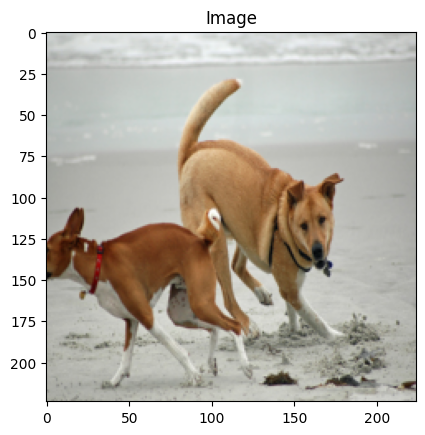

In [ ]:
from matplotlib.backends.backend_pdf import PdfPages

# Retrieve the image and captions for the first data point from the training dataset
image, captions = train_dataset[100]

# Create a new figure and plot the image
fig, ax = plt.subplots()
ax.imshow(image.permute(1, 2, 0))

# Set the title of the image
ax.set_title("Image")

# Print the tokenized captions
print("Tokenized Captions:", captions)

# Convert the tokenized captions to their corresponding words
words = [train_dataset.vocab.itos[token] for token in captions.tolist()]

# Print the sentence
print("Sentence:")
print(words)

# Save the figure as a PDF
pdf = PdfPages("image100tr.pdf")
pdf.savefig(fig)
pdf.close()


Tokenized Captions: tensor([  1,  12,  15,   8,  40,   3,  33,  48,   4,   3,   6,  16, 504,   2])
Sentence:
['<SOS>', 'the', 'man', 'is', 'wearing', '<UNK>', 'and', 'holding', 'a', '<UNK>', 'in', 'his', 'hands', '<EOS>']


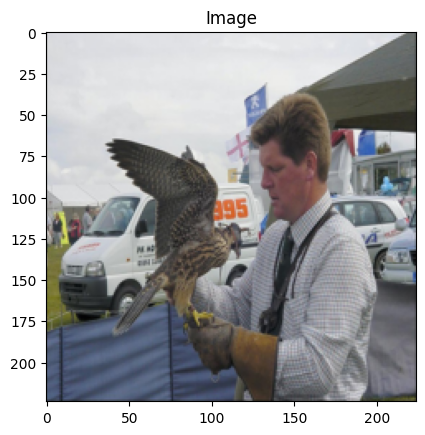

In [ ]:
from matplotlib.backends.backend_pdf import PdfPages

# Retrieve the image and captions for the 100th data point from the training dataset
image, captions = test_dataset[100]

# Create a new figure and plot the image
fig, ax = plt.subplots()
ax.imshow(image.permute(1, 2, 0))

# Set the title of the image
ax.set_title("Image")

# Print the tokenized captions
print("Tokenized Captions:", captions)

# Convert the tokenized captions to their corresponding words
words = [test_dataset.vocab.itos[token] for token in captions.tolist()]

# Print the sentence
print("Sentence:")
print(words)

# Save the figure as a PDF
pdf = PdfPages("image100ts.pdf")
pdf.savefig(fig)
pdf.close()


## **Implement Padding for Sentences in Each Batch**

In [ ]:
class Apppadd:
    """
    Collate function to apply padding to captions with DataLoader.
    """

    def __init__(self, pad_idx, batch_first=False):
        """
        Initialize the Apppadd class.

        Args:
            pad_idx (int): The index of the padding token.
            batch_first (bool): Whether to return the batch dimension as the first dimension.
        """
        self.pad_idx = pad_idx
        self.batch_first = batch_first

    def __call__(self, batch):
        """
        Apply padding to the captions in the batch.

        Args:
            batch (list): List of tuples containing image and caption pairs.

        Returns:
            torch.Tensor: Batch of images.
            torch.Tensor: Batch of padded captions.
        """
        # Extract images from the batch and unsqueeze them
        imgs = [item[0].unsqueeze(0) for item in batch]
        imgs = torch.cat(imgs, dim=0)

        # Extract captions from the batch
        captions = [item[1] for item in batch]

        # Pad the captions using pad_sequence
        captions = pad_sequence(captions, batch_first=self.batch_first, padding_value=self.pad_idx)

        return imgs, captions


## **Evaluating Dataloaders with Padding**

In [ ]:
import multiprocessing

NUM_WORKERS = multiprocessing.cpu_count()
print("Maximum number of workers:", NUM_WORKERS)

Maximum number of workers: 12


In [ ]:
BATCH_SIZE = 4
NUM_WORKERS = 10

# Token to represent the padding
pad_idx = train_dataset.vocab.stoi["<PAD>"]

# Create a DataLoader object to load the training dataset
data_loader = DataLoader(
    dataset=train_dataset,              # Specify the dataset to load
    batch_size=BATCH_SIZE,              # Set the batch size
    num_workers=NUM_WORKERS,            # Set the number of worker processes for data loading
    shuffle=True,                       # Shuffle the data for each epoch
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)   # Specify the collate function for padding captions
)


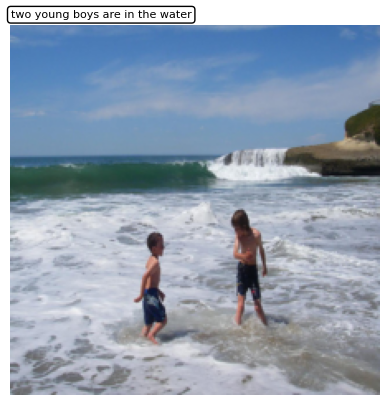

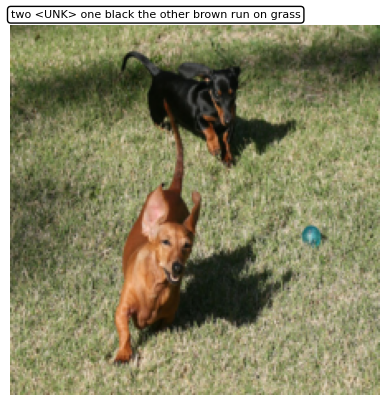

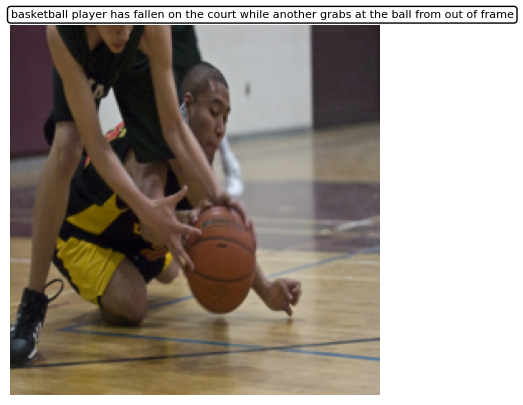

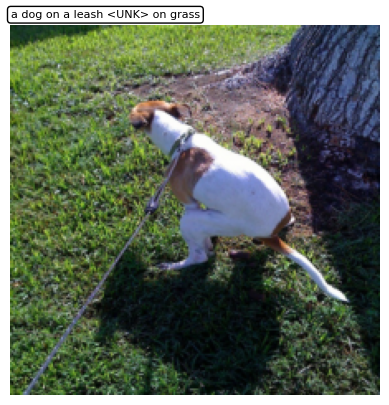

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Generating the iterator from the dataloader
dataiter = iter(data_loader)

# Getting the next batch
batch = next(dataiter)

# Unpacking the batch
images, captions = batch

# Determine the effective batch size
effective_batch_size = min(BATCH_SIZE, len(images))

# Showing information of each image in the batch
for i in range(effective_batch_size):
    img, cap = images[i], captions[i]

    # Extracting the caption label from the numericalized caption
    caption_label = [train_dataset.vocab.itos[token] for token in cap.tolist()]

    # Finding the index of '<EOS>' token to truncate the caption
    eos_index = caption_label.index('<EOS>')
    caption_label = caption_label[1:eos_index]

    # Joining the caption label words into a single string
    caption_label = ' '.join(caption_label)

    # Create a new figure
    fig = plt.figure()

    # Displaying the image with the caption label
    plt.imshow(np.transpose(img.numpy(), (1, 2, 0)))
    plt.axis('off')

    # Calculating the width of the image
    img_width = img.shape[1]

    # Calculating the height of the caption box
    caption_height = int(img_width / 50)

    # Adding a colored box with the caption label
    plt.text(0, -10, caption_label, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round'),
             fontsize=8, color='black', ha='left', va='top')

    # Save the plot as a PDF file
    plt.savefig(f'captionedimage{i}.pdf', format='pdf')

    # Display the plot
    plt.show()


---------------------------------------------

# **Developing an Image Captioning Model:**
- Generate data loaders for training.
- Construct the model architecture and train the model over a specified number of epochs.
- Assess and evaluate the model's performance through testing.

In [ ]:
# Import necessary libraries
import numpy as np
import torch
import warnings
warnings.filterwarnings("ignore")
from torch.utils.data import DataLoader,Dataset
import torchvision.transforms as T
import torch
import torch.nn as nn
import torchvision.models as models
import torch.optim as optim

# **1. Utilize a pre-trained ResNet model for efficient feature extraction, while fine-tuning the last linear layer.**

## **Train**

### **Generate data loaders**

In [ ]:
BATCH_SIZE = 256
NUM_WORKERS = 10
pad_idx = train_dataset.vocab.stoi["<PAD>"]

# Define the transformations to be applied, including resizing, random cropping,
# converting to tensor, and normalization using ResNet statistics
transforms = T.Compose([
    T.Resize(256),
    T.RandomCrop(224),
    T.ToTensor(),
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])

# Create an instance of the FlickrDataset for training
train_dataset = FlickrDataset(
    root_dir="/content/Dataset/Images",
    caption_file="captions.txt",
    transform=transforms,
    data_type='train'
)

# Create a DataLoader for the training dataset
train_loader = DataLoader(
    dataset=train_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    shuffle=True,
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)
)


### **Model**

In [ ]:
#ResNet Model
class ResNet(nn.Module):
    def __init__(self, embed_size, train_resnet=False):
        """
        Initialize the ResNet model with a specified embedding size.
        
        Args:
            embed_size (int): Size of the embedding output.
            train_resnet (bool): Whether to train the ResNet backbone or not.
        """
        super(ResNet, self).__init__()
        
        # Load the pretrained ResNet-18 model
        resnet = models.resnet18(pretrained=True)
        
        # Set the requires_grad flag of the ResNet parameters
        # to control whether they are trainable or not
        for param in resnet.parameters():
            param.requires_grad_(train_resnet)
        
        # Extract the modules of the ResNet model up to the last fully connected layer
        modules = list(resnet.children())[:-1]
        
        # Create the ResNet backbone with the extracted modules
        self.resnet = nn.Sequential(*modules)
        
        # Create the embedding layer
        self.embed = nn.Linear(resnet.fc.in_features, embed_size)
        
        # Activation function and dropout layer
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)

    def forward(self, images):
        """
        Forward pass of the ResNet model.
        
        Args:
            images (tensor): Input images tensor.
        
        Returns:
            features (tensor): Embedded features tensor.
        """
        features = self.dropout(self.relu(self.resnet(images)))
        features = features.view(features.size(0), -1)
        features = self.embed(features)
        return features

# LSTM Network
class LSTM(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1, drop_prob=0.5):
        """
        Initialize the LSTM model with specified sizes and parameters.
        
        Args:
            embed_size (int): Size of the word embedding.
            hidden_size (int): Size of the hidden state of the LSTM.
            vocab_size (int): Size of the vocabulary.
            num_layers (int): Number of layers in the LSTM (default: 1).
            drop_prob (float): Dropout probability (default: 0.5).
        """
        super().__init__()
        
        # Word embedding layer
        self.embedding = nn.Embedding(vocab_size, embed_size)
        
        # LSTM layer
        self.lstm = nn.LSTM(embed_size, hidden_size, num_layers=num_layers, batch_first=True)
        
        # Linear layer for prediction
        self.linear = nn.Linear(hidden_size, vocab_size)
        
        # Dropout layer
        self.dropout = nn.Dropout(drop_prob)
    
    def forward(self, features, captions):
        """
        Forward pass of the LSTM model.
        
        Args:
            features (tensor): Image features tensor.
            captions (tensor): Captions tensor.
        
        Returns:
            x (tensor): Output tensor.
        """
        # Vectorize the caption by passing it through the embedding layer
        embeds = self.dropout(self.embedding(captions[:, :-1]))
        
        # Concatenate the features and captions
        x = torch.cat((features.unsqueeze(1), embeds), dim=1) 
        
        # Pass through the LSTM layer
        x, _ = self.lstm(x)
        
        # Pass through the linear layer for prediction
        x = self.linear(x)
        
        return x

    def generate_caption(self, inputs, hidden=None, max_len=20, vocab=None):
        """
        Generate captions given the image features.
        
        Args:
            inputs (tensor): Input tensor of image features.
            hidden (tuple): Hidden state of the LSTM (default: None).
            max_len (int): Maximum length of the generated caption (default: 20).
            vocab (Vocab): Vocabulary object (default: None).
        
        Returns:
            caption (list): Generated caption as a list of words.
        """
        # Inference part
        # Given the image features, generate the captions
        
        batch_size = inputs.size(0)
        
        captions = []
        
        for i in range(max_len):
            output, hidden = self.lstm(inputs, hidden)
            output = self.linear(output)
            output = output.view(batch_size, -1)
        
            # Select the word with the highest value
            predicted_word_idx = output.argmax(dim=1)
            
            # Save the generated word
            captions.append(predicted_word_idx.item())
            
            # End if <EOS> is detected
            if vocab.itos[predicted_word_idx.item()] == "<EOS>":
                break
            
            # Send the generated word as the next caption
            inputs = self.embedding(predicted_word_idx.unsqueeze(0))
        
        # Convert the vocabulary indices to words and return the sentence
        return [vocab.itos[idx] for idx in captions]

# Utilizing the powerful fusion of ResNet and LSTM for image captioning
class CNNtoRNN(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1, drop_prob=0.5, train_resnet=False):
        """
        Initialize the CNNtoRNN model with specified sizes and parameters.
        
        Args:
            embed_size (int): Size of the word embedding.
            hidden_size (int): Size of the hidden state of the LSTM.
            vocab_size (int): Size of the vocabulary.
            num_layers (int): Number of layers in the LSTM (default: 1).
            drop_prob (float): Dropout probability (default: 0.5).
            train_resnet (bool): Whether to train the ResNet backbone or not (default: False).
        """
        super().__init__()
        
        # Encoder (ResNet)
        self.encoder = ResNet(embed_size, train_resnet)
        
        # Decoder (LSTM)
        self.decoder = LSTM(embed_size, hidden_size, vocab_size, num_layers, drop_prob)
    
    def forward(self, images, captions):
        """
        Forward pass of the CNNtoRNN model.
        
        Args:
            images (tensor): Input images tensor.
            captions (tensor): Captions tensor.
        
        Returns:
            outputs (tensor): Output tensor.
        """
        # Pass the images through the encoder (ResNet) to get features
        features = self.encoder(images)
        
        # Pass the features and captions through the decoder (LSTM) to get outputs
        outputs = self.decoder(features, captions)
        
        return outputs


### **Train the Model**

In [ ]:
# Check if a CUDA-enabled GPU is available
# If available, set the device to "cuda" for GPU computations
# If not available, set the device to "cpu" for CPU computations
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

# Hyperparameters for the model
embed_size = 128  # Size of the word embedding
hidden_size = 256  # Size of the hidden state in the LSTM
vocab_size = len(train_dataset.vocab)  # Size of the vocabulary
num_layers = 1  # Number of layers in the LSTM
learning_rate = 3e-4  # Learning rate for the optimizer

# Initialize the model, loss function, and optimizer
model = CNNtoRNN(embed_size, hidden_size, vocab_size, num_layers, train_resnet=False).to(device)
criterion = nn.CrossEntropyLoss(ignore_index=train_dataset.vocab.stoi["<PAD>"])
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 195MB/s]


Epoch: 1 - Train Loss: 5.2742267722016445
Epoch: 2 - Train Loss: 4.169356649572199
Epoch: 3 - Train Loss: 3.8797206595227434
Epoch: 4 - Train Loss: 3.7080819373364213
Epoch: 5 - Train Loss: 3.584198301488703
Epoch: 6 - Train Loss: 3.481250404477953
Epoch: 7 - Train Loss: 3.3901297129117527
Epoch: 8 - Train Loss: 3.3170354816463443
Epoch: 9 - Train Loss: 3.254032086659145
Epoch: 10 - Train Loss: 3.2015588150157797
Epoch: 11 - Train Loss: 3.154010280862555
Epoch: 12 - Train Loss: 3.1080949856684756
Epoch: 13 - Train Loss: 3.0708032271245145
Epoch: 14 - Train Loss: 3.0341102910208537
Epoch: 15 - Train Loss: 3.002857653411118
Epoch: 16 - Train Loss: 2.9734664196734664
Epoch: 17 - Train Loss: 2.9445293499873233
Epoch: 18 - Train Loss: 2.9184329709806645
Epoch: 19 - Train Loss: 2.8925624610660794
Epoch: 20 - Train Loss: 2.8704545264477495
Epoch: 21 - Train Loss: 2.8482045393723707
Epoch: 22 - Train Loss: 2.829796020801251
Epoch: 23 - Train Loss: 2.8096398106821767
Epoch: 24 - Train Loss: 2.7

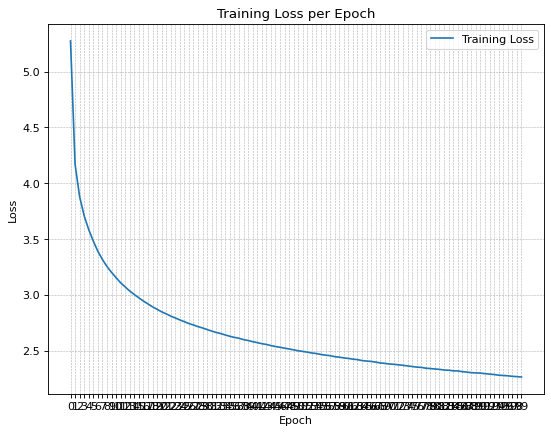

In [ ]:
# Set the number of training epochs
num_epochs = 100

# Create an empty list to store the training loss
train_loss = []

# Training loop
for epoch in range(num_epochs):
    running_loss = 0
    
    # Iterate over the training data loader
    for idx, (image, captions) in enumerate(iter(train_loader)):
        # Move the image and captions to the specified device
        image, captions = image.to(device), captions.to(device)
        
        # Set the model to train mode
        model.train()
        
        # Zero the gradients in the optimizer
        optimizer.zero_grad()
        
        # Feed forward
        outputs = model(image, captions)
        
        # Calculate the batch loss
        loss = criterion(outputs.view(-1, vocab_size), captions.view(-1))
        
        # Backward pass
        loss.backward()
        
        # Update the parameters in the optimizer
        optimizer.step()
        
        # Accumulate the running loss
        running_loss += loss.item()

    # Calculate the average loss for the epoch
    average_loss = running_loss / (idx + 1)
    
    # Print the epoch number and the average loss
    print(f'Epoch: {epoch+1} - Train Loss: {average_loss}')
    
    # Append the average loss to the train_loss list
    train_loss.append(average_loss)
    
    # Save the model after each epoch
    torch.save(model.cpu().state_dict(), 'Model.pth')
    
    # Move the model back to the specified device
    model.cuda()

import matplotlib.pyplot as plt

# Set the figure size and dpi for better quality
plt.figure(figsize=(8, 6), dpi=80)

# Plot the training loss
plt.plot(train_loss, label='Training Loss')

# Set the plot title and axis labels
plt.title("Training Loss per Epoch")
plt.xlabel("Epoch")
plt.ylabel("Loss")

# Customize the grid and ticks
plt.grid(True, linestyle='--', linewidth=0.5)
plt.xticks(range(len(train_loss)))
plt.yticks()

# Add a legend
plt.legend()

# Save the plot as a PDF file
plt.savefig("loss_plot.pdf", format='pdf', bbox_inches='tight')

# Show the plot
plt.show()



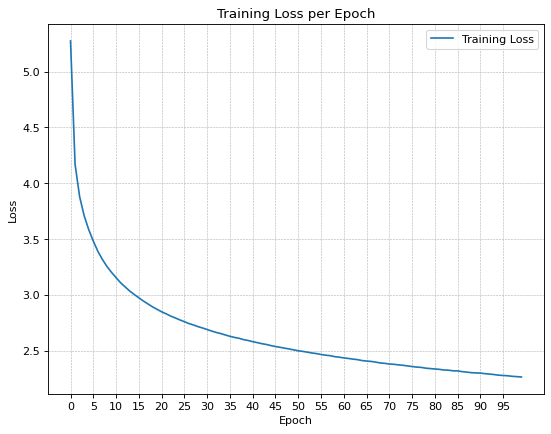

In [ ]:
import matplotlib.pyplot as plt

# Set the figure size and dpi for better quality
plt.figure(figsize=(8, 6), dpi=80)

# Plot the training loss
plt.plot(train_loss, label='Training Loss')

# Set the plot title and axis labels
plt.title("Training Loss per Epoch")
plt.xlabel("Epoch")
plt.ylabel("Loss")

# Customize the grid and ticks
plt.grid(True, linestyle='--', linewidth=0.5)
plt.xticks(range(0, len(train_loss), 5))  # Label every 5th epoch
plt.yticks()

# Add a legend
plt.legend()

# Save the plot as a PDF file
plt.savefig("loss_plot.pdf", format='pdf', bbox_inches='tight')

# Show the plot
plt.show()


## **Test**

### **Generate test data loaders and Test the Model**

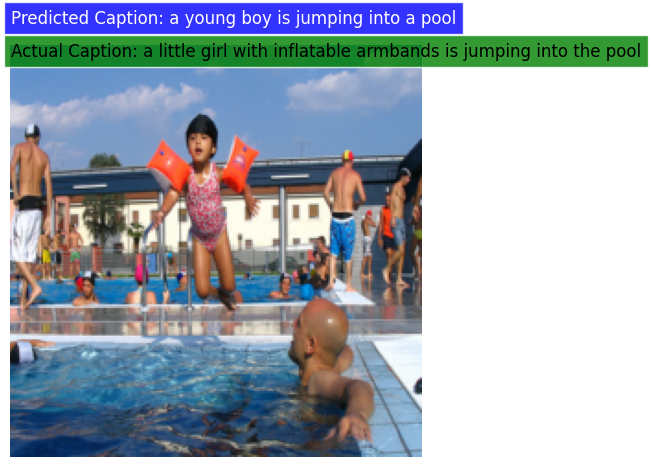

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_captions(image, predicted_caption, real_caption):
    """Display an image with predicted and real captions."""
    
    # Denormalize the image tensor
    image[0] = image[0] * 0.229
    image[1] = image[1] * 0.224
    image[2] = image[2] * 0.225
    image[0] += 0.485
    image[1] += 0.456
    image[2] += 0.406
    
    # Convert the image tensor to a numpy array and transpose the dimensions
    image = image.numpy().transpose((1, 2, 0))
    
    # Display the image
    plt.imshow(image)
    
    # Add predicted caption box
    plt.text(
        0, -20, predicted_caption, color='white', backgroundcolor='blue',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='blue', alpha=0.8, edgecolor='white', pad=5)
    )
    
    # Add real caption box
    plt.text(
        0, -2, real_caption, color='black', backgroundcolor='green',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='green', alpha=0.8, edgecolor='white', pad=5)
    )
    
    plt.axis('off')
    plt.tight_layout()

# Define the test data transformations
test_transforms = T.Compose([
    T.Resize((224, 224)),  # Resize the images to the specified size
    T.ToTensor(),  # Convert the images to tensors
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # Normalize the image tensors
])

# Create the test dataset
test_dataset = FlickrDataset(
    root_dir="Images",  # Root directory of the dataset
    caption_file="captions.txt",  # File containing the captions
    transform=test_transforms,  # Apply the specified transformations to the images
    frequency_threshold=1,  # Frequency threshold for filtering captions
    data_type='test'  # Specify the type of data (in this case, 'test')
)

# Create the test data loader
test_loader = DataLoader(
    dataset=test_dataset,  # Use the created test dataset
    batch_size=BATCH_SIZE,  # Number of samples per batch
    num_workers=NUM_WORKERS,  # Number of worker threads for data loading
    shuffle=True,  # Shuffle the data for each epoch
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)  # Function to collate and preprocess the data
)

# Get a batch of images and captions from the test loader
images, captions = next(iter(test_loader))

# Iterate over a single image and its captions
for i in range(1):
    # Set the model to evaluation mode
    model.eval()
    
    # Get a single test image and create a clone
    test_image = torch.clone(images)[i].unsqueeze(0)
    
    # Disable gradient calculation during inference
    with torch.no_grad():
        # Encode the test image using the model's encoder
        features = model.encoder(test_image[0:1].to(device))
        
        # Generate captions for the test image using the model's decoder
        predicted_captions = model.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
        
        # Get the ground truth caption for the test image
        cap = torch.clone(captions)[i]
        caption_label = [test_dataset.vocab.itos[token] for token in cap.tolist()]
        
        # Find the index of the end-of-sequence token '<EOS>' in the caption
        eos_index = caption_label.index('<EOS>')
        
        # Extract the caption tokens from the start to the '<EOS>' token
        caption_label = caption_label[1:eos_index]
        
        # Convert the caption tokens to a string
        caption_label = ' '.join(caption_label)
        
        # Create the predicted caption string with proper formatting
        predicted_caption = "Predicted Caption: " + ' '.join(predicted_captions[1:len(predicted_captions)-1])
        
        # Create the actual caption string with proper formatting
        real_caption = "Actual Caption: " + caption_label
        
        # Display the image with the predicted and real captions
        show_image_with_captions(test_image[0], predicted_caption, real_caption)

# Save the plot as a PDF file
plt.savefig("testimagecaptions11.pdf", format='pdf', bbox_inches='tight')


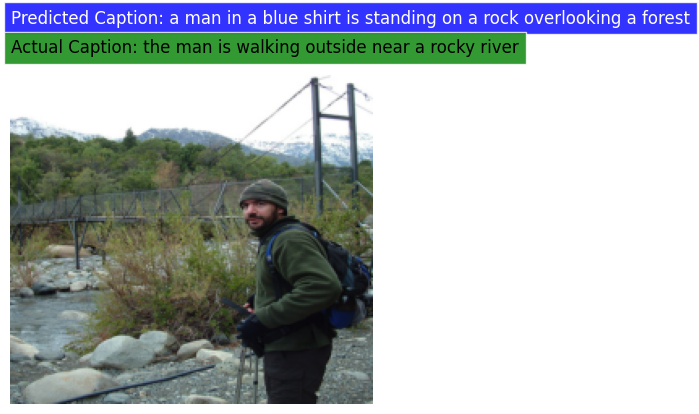

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_captions(image, predicted_caption, real_caption):
    """Display an image with predicted and real captions."""
    
    # Denormalize the image tensor
    image[0] = image[0] * 0.229
    image[1] = image[1] * 0.224
    image[2] = image[2] * 0.225
    image[0] += 0.485
    image[1] += 0.456
    image[2] += 0.406
    
    # Convert the image tensor to a numpy array and transpose the dimensions
    image = image.numpy().transpose((1, 2, 0))
    
    # Display the image
    plt.imshow(image)
    
    # Add predicted caption box
    plt.text(
        0, -20, predicted_caption, color='white', backgroundcolor='blue',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='blue', alpha=0.8, edgecolor='white', pad=5)
    )
    
    # Add real caption box
    plt.text(
        0, -2, real_caption, color='black', backgroundcolor='green',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='green', alpha=0.8, edgecolor='white', pad=5)
    )
    
    plt.axis('off')
    plt.tight_layout()

# Define the test data transformations
test_transforms = T.Compose([
    T.Resize((224, 224)),  # Resize the images to the specified size
    T.ToTensor(),  # Convert the images to tensors
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # Normalize the image tensors
])

# Create the test dataset
test_dataset = FlickrDataset(
    root_dir="Images",  # Root directory of the dataset
    caption_file="captions.txt",  # File containing the captions
    transform=test_transforms,  # Apply the specified transformations to the images
    frequency_threshold=1,  # Frequency threshold for filtering captions
    data_type='test'  # Specify the type of data (in this case, 'test')
)

# Create the test data loader
test_loader = DataLoader(
    dataset=test_dataset,  # Use the created test dataset
    batch_size=BATCH_SIZE,  # Number of samples per batch
    num_workers=NUM_WORKERS,  # Number of worker threads for data loading
    shuffle=True,  # Shuffle the data for each epoch
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)  # Function to collate and preprocess the data
)

# Get a batch of images and captions from the test loader
images, captions = next(iter(test_loader))

# Iterate over a single image and its captions
for i in range(1):
    # Set the model to evaluation mode
    model.eval()
    
    # Get a single test image and create a clone
    test_image = torch.clone(images)[i].unsqueeze(0)
    
    # Disable gradient calculation during inference
    with torch.no_grad():
        # Encode the test image using the model's encoder
        features = model.encoder(test_image[0:1].to(device))
        
        # Generate captions for the test image using the model's decoder
        predicted_captions = model.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
        
        # Get the ground truth caption for the test image
        cap = torch.clone(captions)[i]
        caption_label = [test_dataset.vocab.itos[token] for token in cap.tolist()]
        
        # Find the index of the end-of-sequence token '<EOS>' in the caption
        eos_index = caption_label.index('<EOS>')
        
        # Extract the caption tokens from the start to the '<EOS>' token
        caption_label = caption_label[1:eos_index]
        
        # Convert the caption tokens to a string
        caption_label = ' '.join(caption_label)
        
        # Create the predicted caption string with proper formatting
        predicted_caption = "Predicted Caption: " + ' '.join(predicted_captions[1:len(predicted_captions)-1])
        
        # Create the actual caption string with proper formatting
        real_caption = "Actual Caption: " + caption_label
        
        # Display the image with the predicted and real captions
        show_image_with_captions(test_image[0], predicted_caption, real_caption)

# Save the plot as a PDF file
plt.savefig("testimagecaptions12.pdf", format='pdf', bbox_inches='tight')


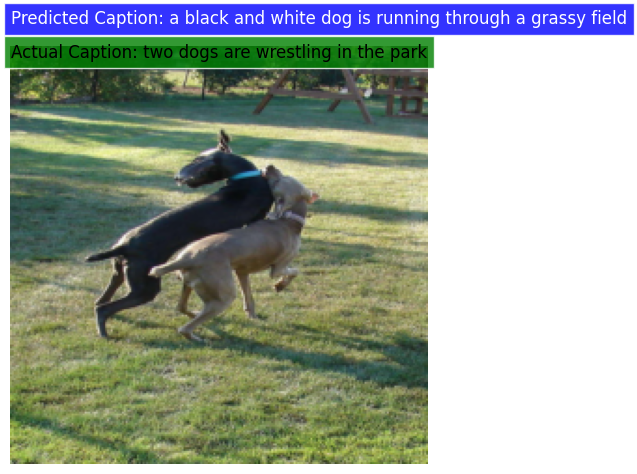

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_captions(image, predicted_caption, real_caption):
    """Display an image with predicted and real captions."""
    
    # Denormalize the image tensor
    image[0] = image[0] * 0.229
    image[1] = image[1] * 0.224
    image[2] = image[2] * 0.225
    image[0] += 0.485
    image[1] += 0.456
    image[2] += 0.406
    
    # Convert the image tensor to a numpy array and transpose the dimensions
    image = image.numpy().transpose((1, 2, 0))
    
    # Display the image
    plt.imshow(image)
    
    # Add predicted caption box
    plt.text(
        0, -20, predicted_caption, color='white', backgroundcolor='blue',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='blue', alpha=0.8, edgecolor='white', pad=5)
    )
    
    # Add real caption box
    plt.text(
        0, -2, real_caption, color='black', backgroundcolor='green',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='green', alpha=0.8, edgecolor='white', pad=5)
    )
    
    plt.axis('off')
    plt.tight_layout()

# Define the test data transformations
test_transforms = T.Compose([
    T.Resize((224, 224)),  # Resize the images to the specified size
    T.ToTensor(),  # Convert the images to tensors
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # Normalize the image tensors
])

# Create the test dataset
test_dataset = FlickrDataset(
    root_dir="Images",  # Root directory of the dataset
    caption_file="captions.txt",  # File containing the captions
    transform=test_transforms,  # Apply the specified transformations to the images
    frequency_threshold=1,  # Frequency threshold for filtering captions
    data_type='test'  # Specify the type of data (in this case, 'test')
)

# Create the test data loader
test_loader = DataLoader(
    dataset=test_dataset,  # Use the created test dataset
    batch_size=BATCH_SIZE,  # Number of samples per batch
    num_workers=NUM_WORKERS,  # Number of worker threads for data loading
    shuffle=True,  # Shuffle the data for each epoch
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)  # Function to collate and preprocess the data
)

# Get a batch of images and captions from the test loader
images, captions = next(iter(test_loader))

# Iterate over a single image and its captions
for i in range(1):
    # Set the model to evaluation mode
    model.eval()
    
    # Get a single test image and create a clone
    test_image = torch.clone(images)[i].unsqueeze(0)
    
    # Disable gradient calculation during inference
    with torch.no_grad():
        # Encode the test image using the model's encoder
        features = model.encoder(test_image[0:1].to(device))
        
        # Generate captions for the test image using the model's decoder
        predicted_captions = model.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
        
        # Get the ground truth caption for the test image
        cap = torch.clone(captions)[i]
        caption_label = [test_dataset.vocab.itos[token] for token in cap.tolist()]
        
        # Find the index of the end-of-sequence token '<EOS>' in the caption
        eos_index = caption_label.index('<EOS>')
        
        # Extract the caption tokens from the start to the '<EOS>' token
        caption_label = caption_label[1:eos_index]
        
        # Convert the caption tokens to a string
        caption_label = ' '.join(caption_label)
        
        # Create the predicted caption string with proper formatting
        predicted_caption = "Predicted Caption: " + ' '.join(predicted_captions[1:len(predicted_captions)-1])
        
        # Create the actual caption string with proper formatting
        real_caption = "Actual Caption: " + caption_label
        
        # Display the image with the predicted and real captions
        show_image_with_captions(test_image[0], predicted_caption, real_caption)

# Save the plot as a PDF file
plt.savefig("testimagecaptions13.pdf", format='pdf', bbox_inches='tight')


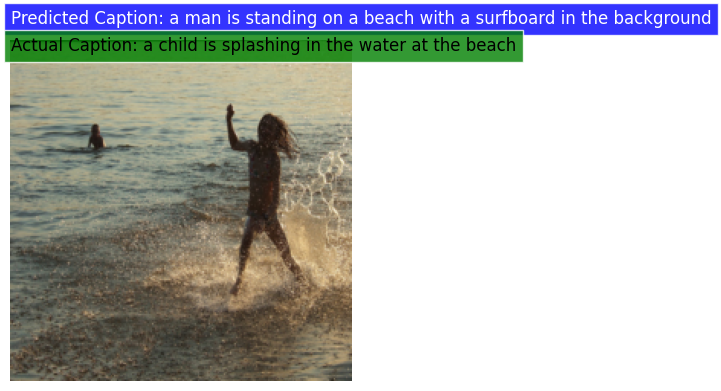

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_captions(image, predicted_caption, real_caption):
    """Display an image with predicted and real captions."""
    
    # Denormalize the image tensor
    image[0] = image[0] * 0.229
    image[1] = image[1] * 0.224
    image[2] = image[2] * 0.225
    image[0] += 0.485
    image[1] += 0.456
    image[2] += 0.406
    
    # Convert the image tensor to a numpy array and transpose the dimensions
    image = image.numpy().transpose((1, 2, 0))
    
    # Display the image
    plt.imshow(image)
    
    # Add predicted caption box
    plt.text(
        0, -20, predicted_caption, color='white', backgroundcolor='blue',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='blue', alpha=0.8, edgecolor='white', pad=5)
    )
    
    # Add real caption box
    plt.text(
        0, -2, real_caption, color='black', backgroundcolor='green',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='green', alpha=0.8, edgecolor='white', pad=5)
    )
    
    plt.axis('off')
    plt.tight_layout()

# Define the test data transformations
test_transforms = T.Compose([
    T.Resize((224, 224)),  # Resize the images to the specified size
    T.ToTensor(),  # Convert the images to tensors
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # Normalize the image tensors
])

# Create the test dataset
test_dataset = FlickrDataset(
    root_dir="Images",  # Root directory of the dataset
    caption_file="captions.txt",  # File containing the captions
    transform=test_transforms,  # Apply the specified transformations to the images
    frequency_threshold=1,  # Frequency threshold for filtering captions
    data_type='test'  # Specify the type of data (in this case, 'test')
)

# Create the test data loader
test_loader = DataLoader(
    dataset=test_dataset,  # Use the created test dataset
    batch_size=BATCH_SIZE,  # Number of samples per batch
    num_workers=NUM_WORKERS,  # Number of worker threads for data loading
    shuffle=True,  # Shuffle the data for each epoch
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)  # Function to collate and preprocess the data
)

# Get a batch of images and captions from the test loader
images, captions = next(iter(test_loader))

# Iterate over a single image and its captions
for i in range(1):
    # Set the model to evaluation mode
    model.eval()
    
    # Get a single test image and create a clone
    test_image = torch.clone(images)[i].unsqueeze(0)
    
    # Disable gradient calculation during inference
    with torch.no_grad():
        # Encode the test image using the model's encoder
        features = model.encoder(test_image[0:1].to(device))
        
        # Generate captions for the test image using the model's decoder
        predicted_captions = model.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
        
        # Get the ground truth caption for the test image
        cap = torch.clone(captions)[i]
        caption_label = [test_dataset.vocab.itos[token] for token in cap.tolist()]
        
        # Find the index of the end-of-sequence token '<EOS>' in the caption
        eos_index = caption_label.index('<EOS>')
        
        # Extract the caption tokens from the start to the '<EOS>' token
        caption_label = caption_label[1:eos_index]
        
        # Convert the caption tokens to a string
        caption_label = ' '.join(caption_label)
        
        # Create the predicted caption string with proper formatting
        predicted_caption = "Predicted Caption: " + ' '.join(predicted_captions[1:len(predicted_captions)-1])
        
        # Create the actual caption string with proper formatting
        real_caption = "Actual Caption: " + caption_label
        
        # Display the image with the predicted and real captions
        show_image_with_captions(test_image[0], predicted_caption, real_caption)

# Save the plot as a PDF file
plt.savefig("testimagecaptions14.pdf", format='pdf', bbox_inches='tight')


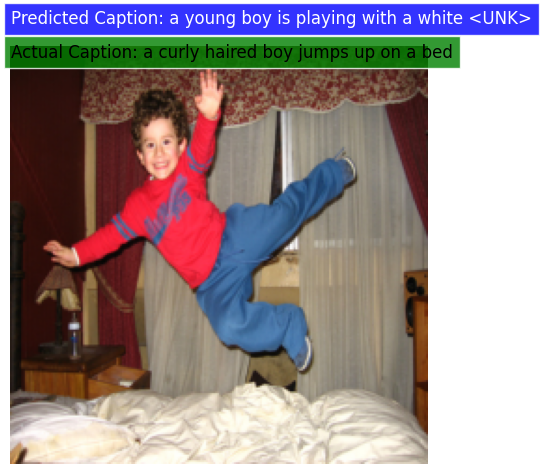

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_captions(image, predicted_caption, real_caption):
    """Display an image with predicted and real captions."""
    
    # Denormalize the image tensor
    image[0] = image[0] * 0.229
    image[1] = image[1] * 0.224
    image[2] = image[2] * 0.225
    image[0] += 0.485
    image[1] += 0.456
    image[2] += 0.406
    
    # Convert the image tensor to a numpy array and transpose the dimensions
    image = image.numpy().transpose((1, 2, 0))
    
    # Display the image
    plt.imshow(image)
    
    # Add predicted caption box
    plt.text(
        0, -20, predicted_caption, color='white', backgroundcolor='blue',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='blue', alpha=0.8, edgecolor='white', pad=5)
    )
    
    # Add real caption box
    plt.text(
        0, -2, real_caption, color='black', backgroundcolor='green',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='green', alpha=0.8, edgecolor='white', pad=5)
    )
    
    plt.axis('off')
    plt.tight_layout()

# Define the test data transformations
test_transforms = T.Compose([
    T.Resize((224, 224)),  # Resize the images to the specified size
    T.ToTensor(),  # Convert the images to tensors
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # Normalize the image tensors
])

# Create the test dataset
test_dataset = FlickrDataset(
    root_dir="Images",  # Root directory of the dataset
    caption_file="captions.txt",  # File containing the captions
    transform=test_transforms,  # Apply the specified transformations to the images
    frequency_threshold=1,  # Frequency threshold for filtering captions
    data_type='test'  # Specify the type of data (in this case, 'test')
)

# Create the test data loader
test_loader = DataLoader(
    dataset=test_dataset,  # Use the created test dataset
    batch_size=BATCH_SIZE,  # Number of samples per batch
    num_workers=NUM_WORKERS,  # Number of worker threads for data loading
    shuffle=True,  # Shuffle the data for each epoch
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)  # Function to collate and preprocess the data
)

# Get a batch of images and captions from the test loader
images, captions = next(iter(test_loader))

# Iterate over a single image and its captions
for i in range(1):
    # Set the model to evaluation mode
    model.eval()
    
    # Get a single test image and create a clone
    test_image = torch.clone(images)[i].unsqueeze(0)
    
    # Disable gradient calculation during inference
    with torch.no_grad():
        # Encode the test image using the model's encoder
        features = model.encoder(test_image[0:1].to(device))
        
        # Generate captions for the test image using the model's decoder
        predicted_captions = model.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
        
        # Get the ground truth caption for the test image
        cap = torch.clone(captions)[i]
        caption_label = [test_dataset.vocab.itos[token] for token in cap.tolist()]
        
        # Find the index of the end-of-sequence token '<EOS>' in the caption
        eos_index = caption_label.index('<EOS>')
        
        # Extract the caption tokens from the start to the '<EOS>' token
        caption_label = caption_label[1:eos_index]
        
        # Convert the caption tokens to a string
        caption_label = ' '.join(caption_label)
        
        # Create the predicted caption string with proper formatting
        predicted_caption = "Predicted Caption: " + ' '.join(predicted_captions[1:len(predicted_captions)-1])
        
        # Create the actual caption string with proper formatting
        real_caption = "Actual Caption: " + caption_label
        
        # Display the image with the predicted and real captions
        show_image_with_captions(test_image[0], predicted_caption, real_caption)

# Save the plot as a PDF file
plt.savefig("testimagecaptions15.pdf", format='pdf', bbox_inches='tight')


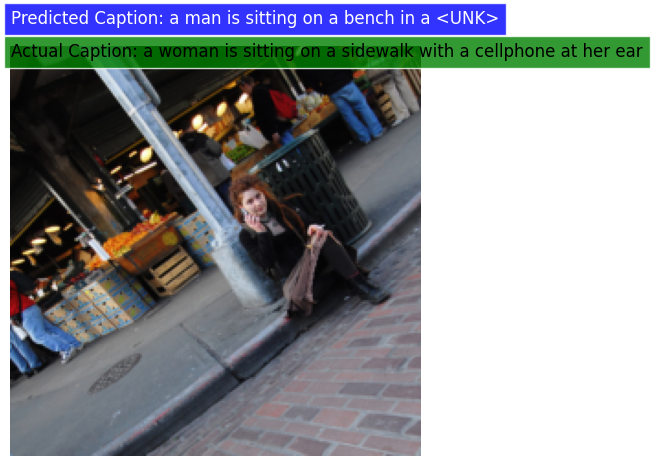

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_captions(image, predicted_caption, real_caption):
    """Display an image with predicted and real captions."""
    
    # Denormalize the image tensor
    image[0] = image[0] * 0.229
    image[1] = image[1] * 0.224
    image[2] = image[2] * 0.225
    image[0] += 0.485
    image[1] += 0.456
    image[2] += 0.406
    
    # Convert the image tensor to a numpy array and transpose the dimensions
    image = image.numpy().transpose((1, 2, 0))
    
    # Display the image
    plt.imshow(image)
    
    # Add predicted caption box
    plt.text(
        0, -20, predicted_caption, color='white', backgroundcolor='blue',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='blue', alpha=0.8, edgecolor='white', pad=5)
    )
    
    # Add real caption box
    plt.text(
        0, -2, real_caption, color='black', backgroundcolor='green',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='green', alpha=0.8, edgecolor='white', pad=5)
    )
    
    plt.axis('off')
    plt.tight_layout()

# Define the test data transformations
test_transforms = T.Compose([
    T.Resize((224, 224)),  # Resize the images to the specified size
    T.ToTensor(),  # Convert the images to tensors
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # Normalize the image tensors
])

# Create the test dataset
test_dataset = FlickrDataset(
    root_dir="Images",  # Root directory of the dataset
    caption_file="captions.txt",  # File containing the captions
    transform=test_transforms,  # Apply the specified transformations to the images
    frequency_threshold=1,  # Frequency threshold for filtering captions
    data_type='test'  # Specify the type of data (in this case, 'test')
)

# Create the test data loader
test_loader = DataLoader(
    dataset=test_dataset,  # Use the created test dataset
    batch_size=BATCH_SIZE,  # Number of samples per batch
    num_workers=NUM_WORKERS,  # Number of worker threads for data loading
    shuffle=True,  # Shuffle the data for each epoch
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)  # Function to collate and preprocess the data
)

# Get a batch of images and captions from the test loader
images, captions = next(iter(test_loader))

# Iterate over a single image and its captions
for i in range(1):
    # Set the model to evaluation mode
    model.eval()
    
    # Get a single test image and create a clone
    test_image = torch.clone(images)[i].unsqueeze(0)
    
    # Disable gradient calculation during inference
    with torch.no_grad():
        # Encode the test image using the model's encoder
        features = model.encoder(test_image[0:1].to(device))
        
        # Generate captions for the test image using the model's decoder
        predicted_captions = model.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
        
        # Get the ground truth caption for the test image
        cap = torch.clone(captions)[i]
        caption_label = [test_dataset.vocab.itos[token] for token in cap.tolist()]
        
        # Find the index of the end-of-sequence token '<EOS>' in the caption
        eos_index = caption_label.index('<EOS>')
        
        # Extract the caption tokens from the start to the '<EOS>' token
        caption_label = caption_label[1:eos_index]
        
        # Convert the caption tokens to a string
        caption_label = ' '.join(caption_label)
        
        # Create the predicted caption string with proper formatting
        predicted_caption = "Predicted Caption: " + ' '.join(predicted_captions[1:len(predicted_captions)-1])
        
        # Create the actual caption string with proper formatting
        real_caption = "Actual Caption: " + caption_label
        
        # Display the image with the predicted and real captions
        show_image_with_captions(test_image[0], predicted_caption, real_caption)

# Save the plot as a PDF file
plt.savefig("testimagecaptions16.pdf", format='pdf', bbox_inches='tight')


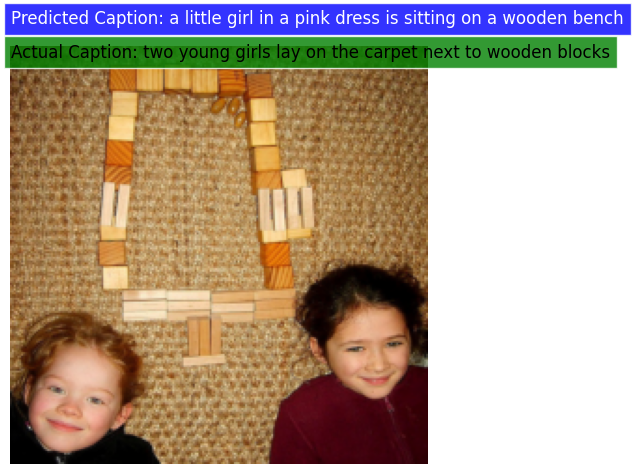

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_captions(image, predicted_caption, real_caption):
    """Display an image with predicted and real captions."""
    
    # Denormalize the image tensor
    image[0] = image[0] * 0.229
    image[1] = image[1] * 0.224
    image[2] = image[2] * 0.225
    image[0] += 0.485
    image[1] += 0.456
    image[2] += 0.406
    
    # Convert the image tensor to a numpy array and transpose the dimensions
    image = image.numpy().transpose((1, 2, 0))
    
    # Display the image
    plt.imshow(image)
    
    # Add predicted caption box
    plt.text(
        0, -20, predicted_caption, color='white', backgroundcolor='blue',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='blue', alpha=0.8, edgecolor='white', pad=5)
    )
    
    # Add real caption box
    plt.text(
        0, -2, real_caption, color='black', backgroundcolor='green',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='green', alpha=0.8, edgecolor='white', pad=5)
    )
    
    plt.axis('off')
    plt.tight_layout()

# Define the test data transformations
test_transforms = T.Compose([
    T.Resize((224, 224)),  # Resize the images to the specified size
    T.ToTensor(),  # Convert the images to tensors
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # Normalize the image tensors
])

# Create the test dataset
test_dataset = FlickrDataset(
    root_dir="Images",  # Root directory of the dataset
    caption_file="captions.txt",  # File containing the captions
    transform=test_transforms,  # Apply the specified transformations to the images
    frequency_threshold=1,  # Frequency threshold for filtering captions
    data_type='test'  # Specify the type of data (in this case, 'test')
)

# Create the test data loader
test_loader = DataLoader(
    dataset=test_dataset,  # Use the created test dataset
    batch_size=BATCH_SIZE,  # Number of samples per batch
    num_workers=NUM_WORKERS,  # Number of worker threads for data loading
    shuffle=True,  # Shuffle the data for each epoch
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)  # Function to collate and preprocess the data
)

# Get a batch of images and captions from the test loader
images, captions = next(iter(test_loader))

# Iterate over a single image and its captions
for i in range(1):
    # Set the model to evaluation mode
    model.eval()
    
    # Get a single test image and create a clone
    test_image = torch.clone(images)[i].unsqueeze(0)
    
    # Disable gradient calculation during inference
    with torch.no_grad():
        # Encode the test image using the model's encoder
        features = model.encoder(test_image[0:1].to(device))
        
        # Generate captions for the test image using the model's decoder
        predicted_captions = model.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
        
        # Get the ground truth caption for the test image
        cap = torch.clone(captions)[i]
        caption_label = [test_dataset.vocab.itos[token] for token in cap.tolist()]
        
        # Find the index of the end-of-sequence token '<EOS>' in the caption
        eos_index = caption_label.index('<EOS>')
        
        # Extract the caption tokens from the start to the '<EOS>' token
        caption_label = caption_label[1:eos_index]
        
        # Convert the caption tokens to a string
        caption_label = ' '.join(caption_label)
        
        # Create the predicted caption string with proper formatting
        predicted_caption = "Predicted Caption: " + ' '.join(predicted_captions[1:len(predicted_captions)-1])
        
        # Create the actual caption string with proper formatting
        real_caption = "Actual Caption: " + caption_label
        
        # Display the image with the predicted and real captions
        show_image_with_captions(test_image[0], predicted_caption, real_caption)

# Save the plot as a PDF file
plt.savefig("testimagecaptions1.pdf", format='pdf', bbox_inches='tight')


## **Train (+ Val)**

In [ ]:
#ResNet Model
class ResNet(nn.Module):
    def __init__(self, embed_size, train_resnet=False):
        """
        Initialize the ResNet model with a specified embedding size.
        
        Args:
            embed_size (int): Size of the embedding output.
            train_resnet (bool): Whether to train the ResNet backbone or not.
        """
        super(ResNet, self).__init__()
        
        # Load the pretrained ResNet-18 model
        resnet = models.resnet18(pretrained=True)
        
        # Set the requires_grad flag of the ResNet parameters
        # to control whether they are trainable or not
        for param in resnet.parameters():
            param.requires_grad_(train_resnet)
        
        # Extract the modules of the ResNet model up to the last fully connected layer
        modules = list(resnet.children())[:-1]
        
        # Create the ResNet backbone with the extracted modules
        self.resnet = nn.Sequential(*modules)
        
        # Create the embedding layer
        self.embed = nn.Linear(resnet.fc.in_features, embed_size)
        
        # Activation function and dropout layer
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)

    def forward(self, images):
        """
        Forward pass of the ResNet model.
        
        Args:
            images (tensor): Input images tensor.
        
        Returns:
            features (tensor): Embedded features tensor.
        """
        features = self.dropout(self.relu(self.resnet(images)))
        features = features.view(features.size(0), -1)
        features = self.embed(features)
        return features

# LSTM Network
class LSTM(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1, drop_prob=0.5):
        """
        Initialize the LSTM model with specified sizes and parameters.
        
        Args:
            embed_size (int): Size of the word embedding.
            hidden_size (int): Size of the hidden state of the LSTM.
            vocab_size (int): Size of the vocabulary.
            num_layers (int): Number of layers in the LSTM (default: 1).
            drop_prob (float): Dropout probability (default: 0.5).
        """
        super().__init__()
        
        # Word embedding layer
        self.embedding = nn.Embedding(vocab_size, embed_size)
        
        # LSTM layer
        self.lstm = nn.LSTM(embed_size, hidden_size, num_layers=num_layers, batch_first=True)
        
        # Linear layer for prediction
        self.linear = nn.Linear(hidden_size, vocab_size)
        
        # Dropout layer
        self.dropout = nn.Dropout(drop_prob)
    
    def forward(self, features, captions):
        """
        Forward pass of the LSTM model.
        
        Args:
            features (tensor): Image features tensor.
            captions (tensor): Captions tensor.
        
        Returns:
            x (tensor): Output tensor.
        """
        # Vectorize the caption by passing it through the embedding layer
        embeds = self.dropout(self.embedding(captions[:, :-1]))
        
        # Concatenate the features and captions
        x = torch.cat((features.unsqueeze(1), embeds), dim=1) 
        
        # Pass through the LSTM layer
        x, _ = self.lstm(x)
        
        # Pass through the linear layer for prediction
        x = self.linear(x)
        
        return x

    def generate_caption(self, inputs, hidden=None, max_len=20, vocab=None):
        """
        Generate captions given the image features.
        
        Args:
            inputs (tensor): Input tensor of image features.
            hidden (tuple): Hidden state of the LSTM (default: None).
            max_len (int): Maximum length of the generated caption (default: 20).
            vocab (Vocab): Vocabulary object (default: None).
        
        Returns:
            caption (list): Generated caption as a list of words.
        """
        # Inference part
        # Given the image features, generate the captions
        
        batch_size = inputs.size(0)
        
        captions = []
        
        for i in range(max_len):
            output, hidden = self.lstm(inputs, hidden)
            output = self.linear(output)
            output = output.view(batch_size, -1)
        
            # Select the word with the highest value
            predicted_word_idx = output.argmax(dim=1)
            
            # Save the generated word
            captions.append(predicted_word_idx.item())
            
            # End if <EOS> is detected
            if vocab.itos[predicted_word_idx.item()] == "<EOS>":
                break
            
            # Send the generated word as the next caption
            inputs = self.embedding(predicted_word_idx.unsqueeze(0))
        
        # Convert the vocabulary indices to words and return the sentence
        return [vocab.itos[idx] for idx in captions]

# Utilizing the powerful fusion of ResNet and LSTM for image captioning
class CNNtoRNN(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1, drop_prob=0.5, train_resnet=False):
        """
        Initialize the CNNtoRNN model with specified sizes and parameters.
        
        Args:
            embed_size (int): Size of the word embedding.
            hidden_size (int): Size of the hidden state of the LSTM.
            vocab_size (int): Size of the vocabulary.
            num_layers (int): Number of layers in the LSTM (default: 1).
            drop_prob (float): Dropout probability (default: 0.5).
            train_resnet (bool): Whether to train the ResNet backbone or not (default: False).
        """
        super().__init__()
        
        # Encoder (ResNet)
        self.encoder = ResNet(embed_size, train_resnet)
        
        # Decoder (LSTM)
        self.decoder = LSTM(embed_size, hidden_size, vocab_size, num_layers, drop_prob)
    
    def forward(self, images, captions):
        """
        Forward pass of the CNNtoRNN model.
        
        Args:
            images (tensor): Input images tensor.
            captions (tensor): Captions tensor.
        
        Returns:
            outputs (tensor): Output tensor.
        """
        # Pass the images through the encoder (ResNet) to get features
        features = self.encoder(images)
        
        # Pass the features and captions through the decoder (LSTM) to get outputs
        outputs = self.decoder(features, captions)
        
        return outputs


In [ ]:
# Check if a CUDA-enabled GPU is available
# If available, set the device to "cuda" for GPU computations
# If not available, set the device to "cpu" for CPU computations
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

# Hyperparameters for the model
embed_size = 128  # Size of the word embedding
hidden_size = 256  # Size of the hidden state in the LSTM
vocab_size = len(train_dataset.vocab)  # Size of the vocabulary
num_layers = 1  # Number of layers in the LSTM
learning_rate = 3e-4  # Learning rate for the optimizer

# Initialize the model, loss function, and optimizer
model = CNNtoRNN(embed_size, hidden_size, vocab_size, num_layers, train_resnet=False).to(device)
criterion = nn.CrossEntropyLoss(ignore_index=train_dataset.vocab.stoi["<PAD>"])
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

Epoch: 1 - Train Loss: 5.3937 - Val Loss: 4.4301
Epoch: 2 - Train Loss: 4.2150 - Val Loss: 4.0397
Epoch: 3 - Train Loss: 3.9220 - Val Loss: 3.8049
Epoch: 4 - Train Loss: 3.7434 - Val Loss: 3.6553
Epoch: 5 - Train Loss: 3.6204 - Val Loss: 3.5436
Epoch: 6 - Train Loss: 3.5186 - Val Loss: 3.4460
Epoch: 7 - Train Loss: 3.4264 - Val Loss: 3.3641
Epoch: 8 - Train Loss: 3.3506 - Val Loss: 3.2957
Epoch: 9 - Train Loss: 3.2884 - Val Loss: 3.2414
Epoch: 10 - Train Loss: 3.2355 - Val Loss: 3.1959
Epoch: 11 - Train Loss: 3.1880 - Val Loss: 3.1525
Epoch: 12 - Train Loss: 3.1436 - Val Loss: 3.1122
Epoch: 13 - Train Loss: 3.1050 - Val Loss: 3.0762
Epoch: 14 - Train Loss: 3.0685 - Val Loss: 3.0463
Epoch: 15 - Train Loss: 3.0353 - Val Loss: 3.0153
Epoch: 16 - Train Loss: 3.0030 - Val Loss: 2.9872
Epoch: 17 - Train Loss: 2.9733 - Val Loss: 2.9627
Epoch: 18 - Train Loss: 2.9463 - Val Loss: 2.9385
Epoch: 19 - Train Loss: 2.9210 - Val Loss: 2.9180
Epoch: 20 - Train Loss: 2.8963 - Val Loss: 2.8987


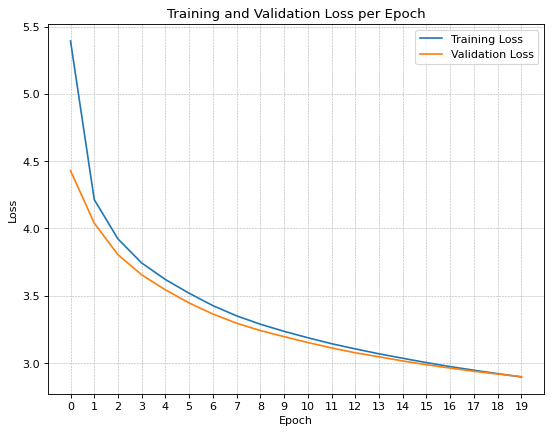

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as T
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Set the batch size, number of workers, and pad index
BATCH_SIZE = 256
NUM_WORKERS = 10
pad_idx = train_dataset.vocab.stoi["<PAD>"]

# Define the transformations to be applied, including resizing, random cropping,
# converting to tensor, and normalization using ResNet statistics
transforms = T.Compose([
    T.Resize(256),
    T.RandomCrop(224),
    T.ToTensor(),
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])

# Create an instance of the FlickrDataset for training
train_dataset = FlickrDataset(
    root_dir="/content/Dataset/Images",
    caption_file="captions.txt",
    transform=transforms,
    data_type='train'
)

# Split the dataset into training and validation sets
train_dataset, val_dataset = train_test_split(train_dataset, test_size=0.1, random_state=42)

# Create a DataLoader for the training dataset
train_loader = DataLoader(
    dataset=train_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    shuffle=True,
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)
)

# Create a DataLoader for the validation dataset
val_loader = DataLoader(
    dataset=val_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    shuffle=False,
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)
)

# Set the number of training epochs
num_epochs = 20

# Create empty lists to store the training and validation loss
train_loss = []
val_loss = []

# Training loop
for epoch in range(num_epochs):
    running_train_loss = 0
    running_val_loss = 0
    
    # Training
    model.train()
    for idx, (image, captions) in enumerate(train_loader):
        image, captions = image.to(device), captions.to(device)
        optimizer.zero_grad()
        outputs = model(image, captions)
        loss = criterion(outputs.view(-1, vocab_size), captions.view(-1))
        loss.backward()
        optimizer.step()
        running_train_loss += loss.item()
    average_train_loss = running_train_loss / len(train_loader)
    train_loss.append(average_train_loss)
    
    # Validation
    model.eval()
    with torch.no_grad():
        for idx, (image, captions) in enumerate(val_loader):
            image, captions = image.to(device), captions.to(device)
            outputs = model(image, captions)
            loss = criterion(outputs.view(-1, vocab_size), captions.view(-1))
            running_val_loss += loss.item()
    average_val_loss = running_val_loss / len(val_loader)
    val_loss.append(average_val_loss)
    
    print(f'Epoch: {epoch+1} - Train Loss: {average_train_loss:.4f} - Val Loss: {average_val_loss:.4f}')
    
    # Save the model after each epoch
    torch.save(model.cpu().state_dict(), 'ModelwithVal.pth')
    model.cuda()

# Plotting the training and validation loss
plt.figure(figsize=(8, 6), dpi=80)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.title("Training and Validation Loss per Epoch")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(True, linestyle='--', linewidth=0.5)
plt.xticks(range(num_epochs))
plt.legend()
plt.savefig("loss_plot.pdf", format='pdf', bbox_inches='tight')
plt.show()

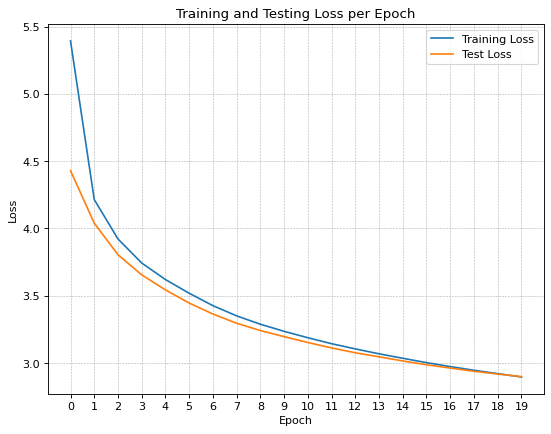

In [ ]:
# Plotting the training and validation loss
plt.figure(figsize=(8, 6), dpi=80)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Test Loss')
plt.title("Training and Testing Loss per Epoch")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(True, linestyle='--', linewidth=0.5)
plt.xticks(range(num_epochs))
plt.legend()
plt.savefig("lossplotwithval1.pdf", format='pdf', bbox_inches='tight')
plt.show()

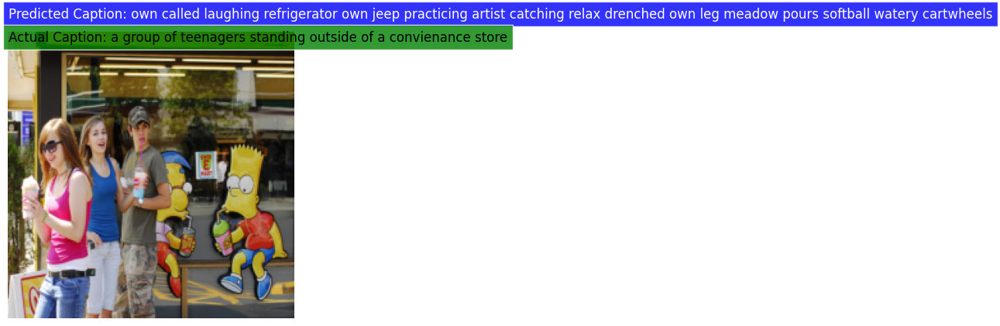

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_captions(image, predicted_caption, real_caption):
    """Display an image with predicted and real captions."""
    
    # Denormalize the image tensor
    image[0] = image[0] * 0.229
    image[1] = image[1] * 0.224
    image[2] = image[2] * 0.225
    image[0] += 0.485
    image[1] += 0.456
    image[2] += 0.406
    
    # Convert the image tensor to a numpy array and transpose the dimensions
    image = image.numpy().transpose((1, 2, 0))
    
    # Display the image
    plt.imshow(image)
    
    # Add predicted caption box
    plt.text(
        0, -20, predicted_caption, color='white', backgroundcolor='blue',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='blue', alpha=0.8, edgecolor='white', pad=5)
    )
    
    # Add real caption box
    plt.text(
        0, -2, real_caption, color='black', backgroundcolor='green',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='green', alpha=0.8, edgecolor='white', pad=5)
    )
    
    plt.axis('off')
    plt.tight_layout()

# Define the test data transformations
test_transforms = T.Compose([
    T.Resize((224, 224)),  # Resize the images to the specified size
    T.ToTensor(),  # Convert the images to tensors
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # Normalize the image tensors
])

# Create the test dataset
test_dataset = FlickrDataset(
    root_dir="Images",  # Root directory of the dataset
    caption_file="captions.txt",  # File containing the captions
    transform=test_transforms,  # Apply the specified transformations to the images
    frequency_threshold=1,  # Frequency threshold for filtering captions
    data_type='test'  # Specify the type of data (in this case, 'test')
)

# Create the test data loader
test_loader = DataLoader(
    dataset=test_dataset,  # Use the created test dataset
    batch_size=BATCH_SIZE,  # Number of samples per batch
    num_workers=NUM_WORKERS,  # Number of worker threads for data loading
    shuffle=True,  # Shuffle the data for each epoch
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)  # Function to collate and preprocess the data
)

# Get a batch of images and captions from the test loader
images, captions = next(iter(test_loader))

# Iterate over a single image and its captions
for i in range(1):
    # Set the model to evaluation mode
    model.eval()
    
    # Get a single test image and create a clone
    test_image = torch.clone(images)[i].unsqueeze(0)
    
    # Disable gradient calculation during inference
    with torch.no_grad():
        # Encode the test image using the model's encoder
        features = model.encoder(test_image[0:1].to(device))
        
        # Generate captions for the test image using the model's decoder
        predicted_captions = model.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
        
        # Get the ground truth caption for the test image
        cap = torch.clone(captions)[i]
        caption_label = [test_dataset.vocab.itos[token] for token in cap.tolist()]
        
        # Find the index of the end-of-sequence token '<EOS>' in the caption
        eos_index = caption_label.index('<EOS>')
        
        # Extract the caption tokens from the start to the '<EOS>' token
        caption_label = caption_label[1:eos_index]
        
        # Convert the caption tokens to a string
        caption_label = ' '.join(caption_label)
        
        # Create the predicted caption string with proper formatting
        predicted_caption = "Predicted Caption: " + ' '.join(predicted_captions[1:len(predicted_captions)-1])
        
        # Create the actual caption string with proper formatting
        real_caption = "Actual Caption: " + caption_label
        
        # Display the image with the predicted and real captions
        show_image_with_captions(test_image[0], predicted_caption, real_caption)

# Save the plot as a PDF file
plt.savefig("testimagecaptionsval11.pdf", format='pdf', bbox_inches='tight')


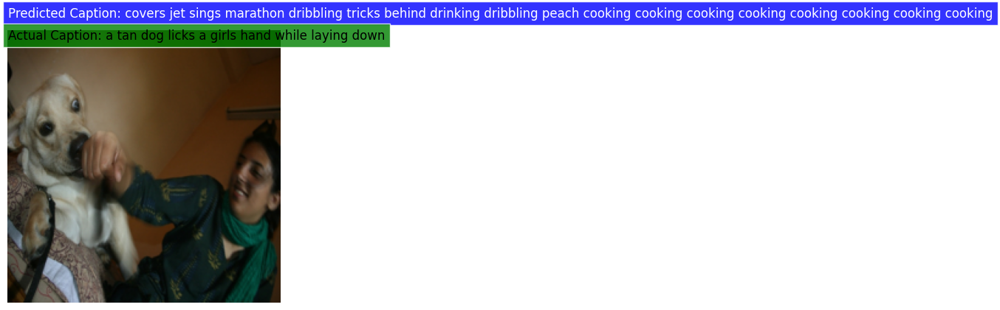

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_captions(image, predicted_caption, real_caption):
    """Display an image with predicted and real captions."""
    
    # Denormalize the image tensor
    image[0] = image[0] * 0.229
    image[1] = image[1] * 0.224
    image[2] = image[2] * 0.225
    image[0] += 0.485
    image[1] += 0.456
    image[2] += 0.406
    
    # Convert the image tensor to a numpy array and transpose the dimensions
    image = image.numpy().transpose((1, 2, 0))
    
    # Display the image
    plt.imshow(image)
    
    # Add predicted caption box
    plt.text(
        0, -20, predicted_caption, color='white', backgroundcolor='blue',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='blue', alpha=0.8, edgecolor='white', pad=5)
    )
    
    # Add real caption box
    plt.text(
        0, -2, real_caption, color='black', backgroundcolor='green',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='green', alpha=0.8, edgecolor='white', pad=5)
    )
    
    plt.axis('off')
    plt.tight_layout()

# Define the test data transformations
test_transforms = T.Compose([
    T.Resize((224, 224)),  # Resize the images to the specified size
    T.ToTensor(),  # Convert the images to tensors
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # Normalize the image tensors
])

# Create the test dataset
test_dataset = FlickrDataset(
    root_dir="Images",  # Root directory of the dataset
    caption_file="captions.txt",  # File containing the captions
    transform=test_transforms,  # Apply the specified transformations to the images
    frequency_threshold=1,  # Frequency threshold for filtering captions
    data_type='test'  # Specify the type of data (in this case, 'test')
)

# Create the test data loader
test_loader = DataLoader(
    dataset=test_dataset,  # Use the created test dataset
    batch_size=BATCH_SIZE,  # Number of samples per batch
    num_workers=NUM_WORKERS,  # Number of worker threads for data loading
    shuffle=True,  # Shuffle the data for each epoch
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)  # Function to collate and preprocess the data
)

# Get a batch of images and captions from the test loader
images, captions = next(iter(test_loader))

# Iterate over a single image and its captions
for i in range(1):
    # Set the model to evaluation mode
    model.eval()
    
    # Get a single test image and create a clone
    test_image = torch.clone(images)[i].unsqueeze(0)
    
    # Disable gradient calculation during inference
    with torch.no_grad():
        # Encode the test image using the model's encoder
        features = model.encoder(test_image[0:1].to(device))
        
        # Generate captions for the test image using the model's decoder
        predicted_captions = model.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
        
        # Get the ground truth caption for the test image
        cap = torch.clone(captions)[i]
        caption_label = [test_dataset.vocab.itos[token] for token in cap.tolist()]
        
        # Find the index of the end-of-sequence token '<EOS>' in the caption
        eos_index = caption_label.index('<EOS>')
        
        # Extract the caption tokens from the start to the '<EOS>' token
        caption_label = caption_label[1:eos_index]
        
        # Convert the caption tokens to a string
        caption_label = ' '.join(caption_label)
        
        # Create the predicted caption string with proper formatting
        predicted_caption = "Predicted Caption: " + ' '.join(predicted_captions[1:len(predicted_captions)-1])
        
        # Create the actual caption string with proper formatting
        real_caption = "Actual Caption: " + caption_label
        
        # Display the image with the predicted and real captions
        show_image_with_captions(test_image[0], predicted_caption, real_caption)

# Save the plot as a PDF file
plt.savefig("testimagecaptionsval12.pdf", format='pdf', bbox_inches='tight')


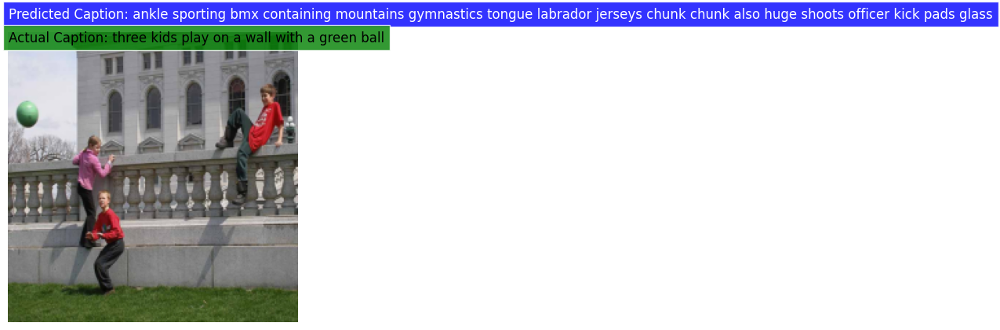

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_captions(image, predicted_caption, real_caption):
    """Display an image with predicted and real captions."""
    
    # Denormalize the image tensor
    image[0] = image[0] * 0.229
    image[1] = image[1] * 0.224
    image[2] = image[2] * 0.225
    image[0] += 0.485
    image[1] += 0.456
    image[2] += 0.406
    
    # Convert the image tensor to a numpy array and transpose the dimensions
    image = image.numpy().transpose((1, 2, 0))
    
    # Display the image
    plt.imshow(image)
    
    # Add predicted caption box
    plt.text(
        0, -20, predicted_caption, color='white', backgroundcolor='blue',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='blue', alpha=0.8, edgecolor='white', pad=5)
    )
    
    # Add real caption box
    plt.text(
        0, -2, real_caption, color='black', backgroundcolor='green',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='green', alpha=0.8, edgecolor='white', pad=5)
    )
    
    plt.axis('off')
    plt.tight_layout()

# Define the test data transformations
test_transforms = T.Compose([
    T.Resize((224, 224)),  # Resize the images to the specified size
    T.ToTensor(),  # Convert the images to tensors
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # Normalize the image tensors
])

# Create the test dataset
test_dataset = FlickrDataset(
    root_dir="Images",  # Root directory of the dataset
    caption_file="captions.txt",  # File containing the captions
    transform=test_transforms,  # Apply the specified transformations to the images
    frequency_threshold=1,  # Frequency threshold for filtering captions
    data_type='test'  # Specify the type of data (in this case, 'test')
)

# Create the test data loader
test_loader = DataLoader(
    dataset=test_dataset,  # Use the created test dataset
    batch_size=BATCH_SIZE,  # Number of samples per batch
    num_workers=NUM_WORKERS,  # Number of worker threads for data loading
    shuffle=True,  # Shuffle the data for each epoch
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)  # Function to collate and preprocess the data
)

# Get a batch of images and captions from the test loader
images, captions = next(iter(test_loader))

# Iterate over a single image and its captions
for i in range(1):
    # Set the model to evaluation mode
    model.eval()
    
    # Get a single test image and create a clone
    test_image = torch.clone(images)[i].unsqueeze(0)
    
    # Disable gradient calculation during inference
    with torch.no_grad():
        # Encode the test image using the model's encoder
        features = model.encoder(test_image[0:1].to(device))
        
        # Generate captions for the test image using the model's decoder
        predicted_captions = model.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
        
        # Get the ground truth caption for the test image
        cap = torch.clone(captions)[i]
        caption_label = [test_dataset.vocab.itos[token] for token in cap.tolist()]
        
        # Find the index of the end-of-sequence token '<EOS>' in the caption
        eos_index = caption_label.index('<EOS>')
        
        # Extract the caption tokens from the start to the '<EOS>' token
        caption_label = caption_label[1:eos_index]
        
        # Convert the caption tokens to a string
        caption_label = ' '.join(caption_label)
        
        # Create the predicted caption string with proper formatting
        predicted_caption = "Predicted Caption: " + ' '.join(predicted_captions[1:len(predicted_captions)-1])
        
        # Create the actual caption string with proper formatting
        real_caption = "Actual Caption: " + caption_label
        
        # Display the image with the predicted and real captions
        show_image_with_captions(test_image[0], predicted_caption, real_caption)

# Save the plot as a PDF file
plt.savefig("testimagecaptionsval13.pdf", format='pdf', bbox_inches='tight')


# **2. Utilize a ResNet model (without freezing) for efficient feature extraction, while fine-tuning the last linear layer.**

## **Train**

### **Generate data loaders**

In [ ]:
BATCH_SIZE = 256
NUM_WORKERS = 10
pad_idx = train_dataset.vocab.stoi["<PAD>"]

# Define the transformations to be applied, including resizing, random cropping,
# converting to tensor, and normalization using ResNet statistics
transforms = T.Compose([
    T.Resize(256),
    T.RandomCrop(224),
    T.ToTensor(),
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])

# Create an instance of the FlickrDataset for training
train_dataset = FlickrDataset(
    root_dir="/content/Dataset/Images",
    caption_file="captions.txt",
    transform=transforms,
    data_type='train'
)

# Create a DataLoader for the training dataset
train_loader = DataLoader(
    dataset=train_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    shuffle=True,
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)
)


### **Model**

In [ ]:
#ResNet Model
class ResNet(nn.Module):
    def __init__(self, embed_size, train_resnet=False):
        """
        Initialize the ResNet model with a specified embedding size.
        
        Args:
            embed_size (int): Size of the embedding output.
            train_resnet (bool): Whether to train the ResNet backbone or not.
        """
        super(ResNet, self).__init__()
        
        # Load the pretrained ResNet-18 model
        resnet = models.resnet18(pretrained=True)
        
        # Set the requires_grad flag of the ResNet parameters
        # to control whether they are trainable or not
        for param in resnet.parameters():
            param.requires_grad_(train_resnet)
        
        # Extract the modules of the ResNet model up to the last fully connected layer
        modules = list(resnet.children())[:-1]
        
        # Create the ResNet backbone with the extracted modules
        self.resnet = nn.Sequential(*modules)
        
        # Create the embedding layer
        self.embed = nn.Linear(resnet.fc.in_features, embed_size)
        
        # Activation function and dropout layer
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)

    def forward(self, images):
        """
        Forward pass of the ResNet model.
        
        Args:
            images (tensor): Input images tensor.
        
        Returns:
            features (tensor): Embedded features tensor.
        """
        features = self.dropout(self.relu(self.resnet(images)))
        features = features.view(features.size(0), -1)
        features = self.embed(features)
        return features

# LSTM Network
class LSTM(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1, drop_prob=0.5):
        """
        Initialize the LSTM model with specified sizes and parameters.
        
        Args:
            embed_size (int): Size of the word embedding.
            hidden_size (int): Size of the hidden state of the LSTM.
            vocab_size (int): Size of the vocabulary.
            num_layers (int): Number of layers in the LSTM (default: 1).
            drop_prob (float): Dropout probability (default: 0.5).
        """
        super().__init__()
        
        # Word embedding layer
        self.embedding = nn.Embedding(vocab_size, embed_size)
        
        # LSTM layer
        self.lstm = nn.LSTM(embed_size, hidden_size, num_layers=num_layers, batch_first=True)
        
        # Linear layer for prediction
        self.linear = nn.Linear(hidden_size, vocab_size)
        
        # Dropout layer
        self.dropout = nn.Dropout(drop_prob)
    
    def forward(self, features, captions):
        """
        Forward pass of the LSTM model.
        
        Args:
            features (tensor): Image features tensor.
            captions (tensor): Captions tensor.
        
        Returns:
            x (tensor): Output tensor.
        """
        # Vectorize the caption by passing it through the embedding layer
        embeds = self.dropout(self.embedding(captions[:, :-1]))
        
        # Concatenate the features and captions
        x = torch.cat((features.unsqueeze(1), embeds), dim=1) 
        
        # Pass through the LSTM layer
        x, _ = self.lstm(x)
        
        # Pass through the linear layer for prediction
        x = self.linear(x)
        
        return x

    def generate_caption(self, inputs, hidden=None, max_len=20, vocab=None):
        """
        Generate captions given the image features.
        
        Args:
            inputs (tensor): Input tensor of image features.
            hidden (tuple): Hidden state of the LSTM (default: None).
            max_len (int): Maximum length of the generated caption (default: 20).
            vocab (Vocab): Vocabulary object (default: None).
        
        Returns:
            caption (list): Generated caption as a list of words.
        """
        # Inference part
        # Given the image features, generate the captions
        
        batch_size = inputs.size(0)
        
        captions = []
        
        for i in range(max_len):
            output, hidden = self.lstm(inputs, hidden)
            output = self.linear(output)
            output = output.view(batch_size, -1)
        
            # Select the word with the highest value
            predicted_word_idx = output.argmax(dim=1)
            
            # Save the generated word
            captions.append(predicted_word_idx.item())
            
            # End if <EOS> is detected
            if vocab.itos[predicted_word_idx.item()] == "<EOS>":
                break
            
            # Send the generated word as the next caption
            inputs = self.embedding(predicted_word_idx.unsqueeze(0))
        
        # Convert the vocabulary indices to words and return the sentence
        return [vocab.itos[idx] for idx in captions]

# Utilizing the powerful fusion of ResNet and LSTM for image captioning
class CNNtoRNN(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1, drop_prob=0.5, train_resnet=False):
        """
        Initialize the CNNtoRNN model with specified sizes and parameters.
        
        Args:
            embed_size (int): Size of the word embedding.
            hidden_size (int): Size of the hidden state of the LSTM.
            vocab_size (int): Size of the vocabulary.
            num_layers (int): Number of layers in the LSTM (default: 1).
            drop_prob (float): Dropout probability (default: 0.5).
            train_resnet (bool): Whether to train the ResNet backbone or not (default: False).
        """
        super().__init__()
        
        # Encoder (ResNet)
        self.encoder = ResNet(embed_size, train_resnet)
        
        # Decoder (LSTM)
        self.decoder = LSTM(embed_size, hidden_size, vocab_size, num_layers, drop_prob)
    
    def forward(self, images, captions):
        """
        Forward pass of the CNNtoRNN model.
        
        Args:
            images (tensor): Input images tensor.
            captions (tensor): Captions tensor.
        
        Returns:
            outputs (tensor): Output tensor.
        """
        # Pass the images through the encoder (ResNet) to get features
        features = self.encoder(images)
        
        # Pass the features and captions through the decoder (LSTM) to get outputs
        outputs = self.decoder(features, captions)
        
        return outputs


### **Train the Model**

In [ ]:
# Check if a CUDA-enabled GPU is available
# If available, set the device to "cuda" for GPU computations
# If not available, set the device to "cpu" for CPU computations
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

# Hyperparameters for the model
embed_size = 128  # Size of the word embedding
hidden_size = 256  # Size of the hidden state in the LSTM
vocab_size = len(train_dataset.vocab)  # Size of the vocabulary
num_layers = 1  # Number of layers in the LSTM
learning_rate = 3e-4  # Learning rate for the optimizer

# Initialize the model, loss function, and optimizer
NoFreeze_model = CNNtoRNN(embed_size, hidden_size, vocab_size, num_layers, train_resnet=True).to(device)
criterion = nn.CrossEntropyLoss(ignore_index=train_dataset.vocab.stoi["<PAD>"])
optimizer = optim.Adam(NoFreeze_model.parameters(), lr=learning_rate)

Epoch: 1 - Train Loss: 5.2784986095828605
Epoch: 2 - Train Loss: 4.1686154712330215
Epoch: 3 - Train Loss: 3.892264472854721
Epoch: 4 - Train Loss: 3.71403486245162
Epoch: 5 - Train Loss: 3.5789838320725447
Epoch: 6 - Train Loss: 3.4679061566199456
Epoch: 7 - Train Loss: 3.3738862034324164
Epoch: 8 - Train Loss: 3.2915008068084717
Epoch: 9 - Train Loss: 3.2161747125478892
Epoch: 10 - Train Loss: 3.152081139437802
Epoch: 11 - Train Loss: 3.0963563969085266
Epoch: 12 - Train Loss: 3.0444981201545342
Epoch: 13 - Train Loss: 2.9997586453711236
Epoch: 14 - Train Loss: 2.9552106473829363
Epoch: 15 - Train Loss: 2.9174508398229424
Epoch: 16 - Train Loss: 2.87865136219905
Epoch: 17 - Train Loss: 2.8420916954120554
Epoch: 18 - Train Loss: 2.812301120557985
Epoch: 19 - Train Loss: 2.77961974544125
Epoch: 20 - Train Loss: 2.7535584389746606
Epoch: 21 - Train Loss: 2.7266371733658796
Epoch: 22 - Train Loss: 2.700983681045212
Epoch: 23 - Train Loss: 2.678259536102935
Epoch: 24 - Train Loss: 2.65549

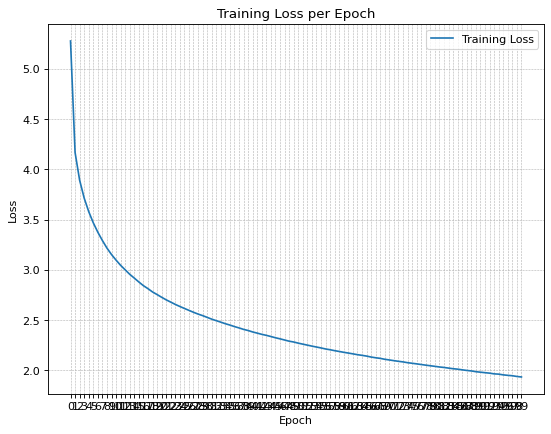

In [ ]:
# Set the number of training epochs
num_epochs = 100

# Create an empty list to store the training loss
NoFreeze_train_loss = []

# Training loop
for epoch in range(num_epochs):
    running_loss = 0
    
    # Iterate over the training data loader
    for idx, (image, captions) in enumerate(iter(train_loader)):
        # Move the image and captions to the specified device
        image, captions = image.to(device), captions.to(device)
        
        # Set the model to train mode
        NoFreeze_model.train()
        
        # Zero the gradients in the optimizer
        optimizer.zero_grad()
        
        # Feed forward
        outputs = NoFreeze_model(image, captions)
        
        # Calculate the batch loss
        loss = criterion(outputs.view(-1, vocab_size), captions.view(-1))
        
        # Backward pass
        loss.backward()
        
        # Update the parameters in the optimizer
        optimizer.step()
        
        # Accumulate the running loss
        running_loss += loss.item()

    # Calculate the average loss for the epoch
    average_loss = running_loss / (idx + 1)
    
    # Print the epoch number and the average loss
    print(f'Epoch: {epoch+1} - Train Loss: {average_loss}')
    
    # Append the average loss to the train_loss list
    NoFreeze_train_loss.append(average_loss)
    
    # Save the model after each epoch
    torch.save(NoFreeze_model.cpu().state_dict(), 'NoFreezeModel.pth')
    
    # Move the model back to the specified device
    NoFreeze_model.cuda()

import matplotlib.pyplot as plt

# Set the figure size and dpi for better quality
plt.figure(figsize=(8, 6), dpi=80)

# Plot the training loss
plt.plot(NoFreeze_train_loss, label='Training Loss')

# Set the plot title and axis labels
plt.title("Training Loss per Epoch")
plt.xlabel("Epoch")
plt.ylabel("Loss")

# Customize the grid and ticks
plt.grid(True, linestyle='--', linewidth=0.5)
plt.xticks(range(len(NoFreeze_train_loss)))
plt.yticks()

# Add a legend
plt.legend()

# Save the plot as a PDF file
plt.savefig("loss_plot.pdf", format='pdf', bbox_inches='tight')

# Show the plot
plt.show()



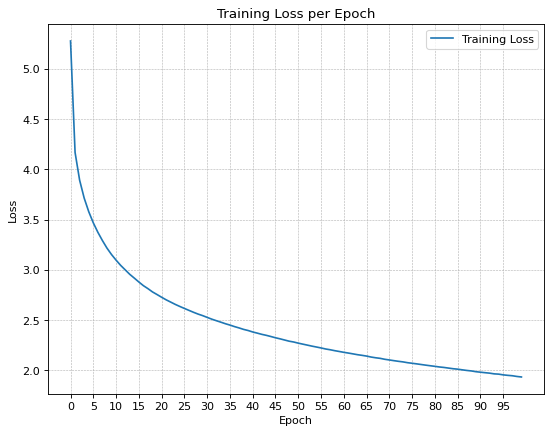

In [ ]:
import matplotlib.pyplot as plt

# Set the figure size and dpi for better quality
plt.figure(figsize=(8, 6), dpi=80)

# Plot the training loss
plt.plot(NoFreeze_train_loss, label='Training Loss')

# Set the plot title and axis labels
plt.title("Training Loss per Epoch")
plt.xlabel("Epoch")
plt.ylabel("Loss")

# Customize the grid and ticks
plt.grid(True, linestyle='--', linewidth=0.5)
plt.xticks(range(0, len(NoFreeze_train_loss), 5))  # Label every 5th epoch
plt.yticks()

# Add a legend
plt.legend()

# Save the plot as a PDF file
plt.savefig("loss_plot2.pdf", format='pdf', bbox_inches='tight')

# Show the plot
plt.show()


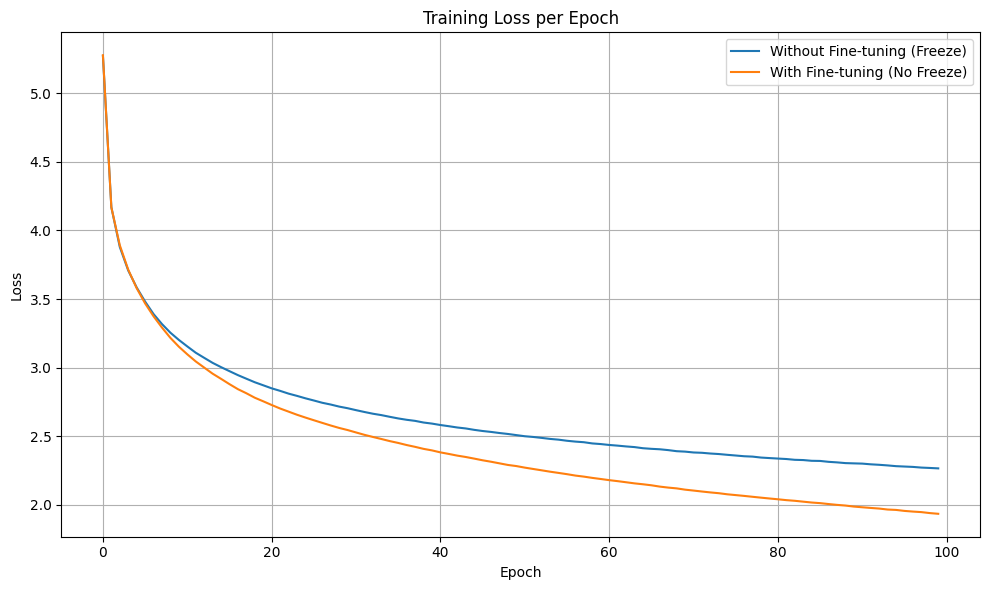

In [ ]:
# Import the necessary libraries
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(10, 6))

# Set the plot title and axis labels
plt.title("Training Loss per Epoch")
plt.xlabel("Epoch")
plt.ylabel("Loss")

# Plot the training loss curves
plt.plot(train_loss, label='Without Fine-tuning (Freeze)')
plt.plot(NoFreeze_train_loss, label='With Fine-tuning (No Freeze)')

# Add a legend to the plot
plt.legend()

# Add grid lines to the plot
plt.grid(True)

# Adjust the layout for a more compact and professional appearance
plt.tight_layout()

# Add a legend
plt.legend()

# Save the plot as a PDF file
plt.savefig("comparelossplot2.pdf", format='pdf', bbox_inches='tight')

# Display the plot
plt.show()


## **Test**

### **Generate test data loaders and Test the Model**

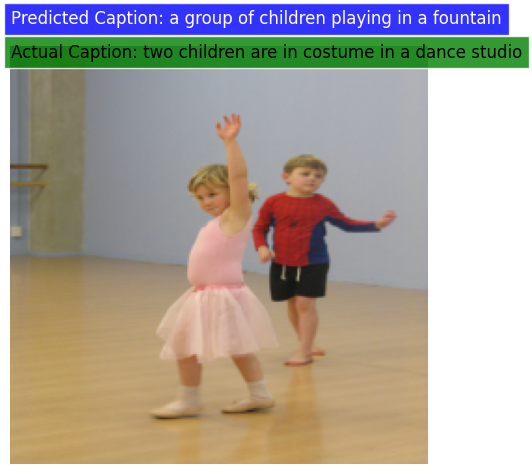

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_captions(image, predicted_caption, real_caption):
    """Display an image with predicted and real captions."""
    
    # Denormalize the image tensor
    image[0] = image[0] * 0.229
    image[1] = image[1] * 0.224
    image[2] = image[2] * 0.225
    image[0] += 0.485
    image[1] += 0.456
    image[2] += 0.406
    
    # Convert the image tensor to a numpy array and transpose the dimensions
    image = image.numpy().transpose((1, 2, 0))
    
    # Display the image
    plt.imshow(image)
    
    # Add predicted caption box
    plt.text(
        0, -20, predicted_caption, color='white', backgroundcolor='blue',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='blue', alpha=0.8, edgecolor='white', pad=5)
    )
    
    # Add real caption box
    plt.text(
        0, -2, real_caption, color='black', backgroundcolor='green',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='green', alpha=0.8, edgecolor='white', pad=5)
    )
    
    plt.axis('off')
    plt.tight_layout()

# Define the test data transformations
test_transforms = T.Compose([
    T.Resize((224, 224)),  # Resize the images to the specified size
    T.ToTensor(),  # Convert the images to tensors
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # Normalize the image tensors
])

# Create the test dataset
test_dataset = FlickrDataset(
    root_dir="Images",  # Root directory of the dataset
    caption_file="captions.txt",  # File containing the captions
    transform=test_transforms,  # Apply the specified transformations to the images
    frequency_threshold=1,  # Frequency threshold for filtering captions
    data_type='test'  # Specify the type of data (in this case, 'test')
)

# Create the test data loader
test_loader = DataLoader(
    dataset=test_dataset,  # Use the created test dataset
    batch_size=BATCH_SIZE,  # Number of samples per batch
    num_workers=NUM_WORKERS,  # Number of worker threads for data loading
    shuffle=True,  # Shuffle the data for each epoch
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)  # Function to collate and preprocess the data
)

# Get a batch of images and captions from the test loader
images, captions = next(iter(test_loader))

# Iterate over a single image and its captions
for i in range(1):
    # Set the model to evaluation mode
    NoFreeze_model.eval()
    
    # Get a single test image and create a clone
    test_image = torch.clone(images)[i].unsqueeze(0)
    
    # Disable gradient calculation during inference
    with torch.no_grad():
        # Encode the test image using the model's encoder
        features = NoFreeze_model.encoder(test_image[0:1].to(device))
        
        # Generate captions for the test image using the model's decoder
        predicted_captions = NoFreeze_model.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
        
        # Get the ground truth caption for the test image
        cap = torch.clone(captions)[i]
        caption_label = [test_dataset.vocab.itos[token] for token in cap.tolist()]
        
        # Find the index of the end-of-sequence token '<EOS>' in the caption
        eos_index = caption_label.index('<EOS>')
        
        # Extract the caption tokens from the start to the '<EOS>' token
        caption_label = caption_label[1:eos_index]
        
        # Convert the caption tokens to a string
        caption_label = ' '.join(caption_label)
        
        # Create the predicted caption string with proper formatting
        predicted_caption = "Predicted Caption: " + ' '.join(predicted_captions[1:len(predicted_captions)-1])
        
        # Create the actual caption string with proper formatting
        real_caption = "Actual Caption: " + caption_label
        
        # Display the image with the predicted and real captions
        show_image_with_captions(test_image[0], predicted_caption, real_caption)

# Save the plot as a PDF file
plt.savefig("testimagecaptions21.pdf", format='pdf', bbox_inches='tight')


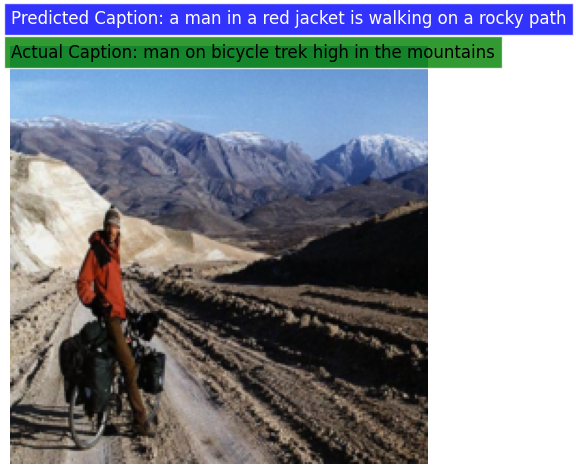

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_captions(image, predicted_caption, real_caption):
    """Display an image with predicted and real captions."""
    
    # Denormalize the image tensor
    image[0] = image[0] * 0.229
    image[1] = image[1] * 0.224
    image[2] = image[2] * 0.225
    image[0] += 0.485
    image[1] += 0.456
    image[2] += 0.406
    
    # Convert the image tensor to a numpy array and transpose the dimensions
    image = image.numpy().transpose((1, 2, 0))
    
    # Display the image
    plt.imshow(image)
    
    # Add predicted caption box
    plt.text(
        0, -20, predicted_caption, color='white', backgroundcolor='blue',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='blue', alpha=0.8, edgecolor='white', pad=5)
    )
    
    # Add real caption box
    plt.text(
        0, -2, real_caption, color='black', backgroundcolor='green',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='green', alpha=0.8, edgecolor='white', pad=5)
    )
    
    plt.axis('off')
    plt.tight_layout()

# Define the test data transformations
test_transforms = T.Compose([
    T.Resize((224, 224)),  # Resize the images to the specified size
    T.ToTensor(),  # Convert the images to tensors
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # Normalize the image tensors
])

# Create the test dataset
test_dataset = FlickrDataset(
    root_dir="Images",  # Root directory of the dataset
    caption_file="captions.txt",  # File containing the captions
    transform=test_transforms,  # Apply the specified transformations to the images
    frequency_threshold=1,  # Frequency threshold for filtering captions
    data_type='test'  # Specify the type of data (in this case, 'test')
)

# Create the test data loader
test_loader = DataLoader(
    dataset=test_dataset,  # Use the created test dataset
    batch_size=BATCH_SIZE,  # Number of samples per batch
    num_workers=NUM_WORKERS,  # Number of worker threads for data loading
    shuffle=True,  # Shuffle the data for each epoch
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)  # Function to collate and preprocess the data
)

# Get a batch of images and captions from the test loader
images, captions = next(iter(test_loader))

# Iterate over a single image and its captions
for i in range(1):
    # Set the model to evaluation mode
    NoFreeze_model.eval()
    
    # Get a single test image and create a clone
    test_image = torch.clone(images)[i].unsqueeze(0)
    
    # Disable gradient calculation during inference
    with torch.no_grad():
        # Encode the test image using the model's encoder
        features = NoFreeze_model.encoder(test_image[0:1].to(device))
        
        # Generate captions for the test image using the model's decoder
        predicted_captions = NoFreeze_model.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
        
        # Get the ground truth caption for the test image
        cap = torch.clone(captions)[i]
        caption_label = [test_dataset.vocab.itos[token] for token in cap.tolist()]
        
        # Find the index of the end-of-sequence token '<EOS>' in the caption
        eos_index = caption_label.index('<EOS>')
        
        # Extract the caption tokens from the start to the '<EOS>' token
        caption_label = caption_label[1:eos_index]
        
        # Convert the caption tokens to a string
        caption_label = ' '.join(caption_label)
        
        # Create the predicted caption string with proper formatting
        predicted_caption = "Predicted Caption: " + ' '.join(predicted_captions[1:len(predicted_captions)-1])
        
        # Create the actual caption string with proper formatting
        real_caption = "Actual Caption: " + caption_label
        
        # Display the image with the predicted and real captions
        show_image_with_captions(test_image[0], predicted_caption, real_caption)

# Save the plot as a PDF file
plt.savefig("testimagecaptions22.pdf", format='pdf', bbox_inches='tight')


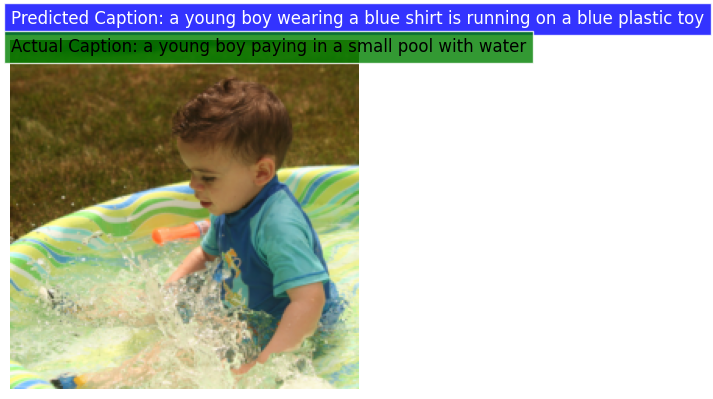

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_captions(image, predicted_caption, real_caption):
    """Display an image with predicted and real captions."""
    
    # Denormalize the image tensor
    image[0] = image[0] * 0.229
    image[1] = image[1] * 0.224
    image[2] = image[2] * 0.225
    image[0] += 0.485
    image[1] += 0.456
    image[2] += 0.406
    
    # Convert the image tensor to a numpy array and transpose the dimensions
    image = image.numpy().transpose((1, 2, 0))
    
    # Display the image
    plt.imshow(image)
    
    # Add predicted caption box
    plt.text(
        0, -20, predicted_caption, color='white', backgroundcolor='blue',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='blue', alpha=0.8, edgecolor='white', pad=5)
    )
    
    # Add real caption box
    plt.text(
        0, -2, real_caption, color='black', backgroundcolor='green',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='green', alpha=0.8, edgecolor='white', pad=5)
    )
    
    plt.axis('off')
    plt.tight_layout()

# Define the test data transformations
test_transforms = T.Compose([
    T.Resize((224, 224)),  # Resize the images to the specified size
    T.ToTensor(),  # Convert the images to tensors
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # Normalize the image tensors
])

# Create the test dataset
test_dataset = FlickrDataset(
    root_dir="Images",  # Root directory of the dataset
    caption_file="captions.txt",  # File containing the captions
    transform=test_transforms,  # Apply the specified transformations to the images
    frequency_threshold=1,  # Frequency threshold for filtering captions
    data_type='test'  # Specify the type of data (in this case, 'test')
)

# Create the test data loader
test_loader = DataLoader(
    dataset=test_dataset,  # Use the created test dataset
    batch_size=BATCH_SIZE,  # Number of samples per batch
    num_workers=NUM_WORKERS,  # Number of worker threads for data loading
    shuffle=True,  # Shuffle the data for each epoch
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)  # Function to collate and preprocess the data
)

# Get a batch of images and captions from the test loader
images, captions = next(iter(test_loader))

# Iterate over a single image and its captions
for i in range(1):
    # Set the model to evaluation mode
    NoFreeze_model.eval()
    
    # Get a single test image and create a clone
    test_image = torch.clone(images)[i].unsqueeze(0)
    
    # Disable gradient calculation during inference
    with torch.no_grad():
        # Encode the test image using the model's encoder
        features = NoFreeze_model.encoder(test_image[0:1].to(device))
        
        # Generate captions for the test image using the model's decoder
        predicted_captions = NoFreeze_model.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
        
        # Get the ground truth caption for the test image
        cap = torch.clone(captions)[i]
        caption_label = [test_dataset.vocab.itos[token] for token in cap.tolist()]
        
        # Find the index of the end-of-sequence token '<EOS>' in the caption
        eos_index = caption_label.index('<EOS>')
        
        # Extract the caption tokens from the start to the '<EOS>' token
        caption_label = caption_label[1:eos_index]
        
        # Convert the caption tokens to a string
        caption_label = ' '.join(caption_label)
        
        # Create the predicted caption string with proper formatting
        predicted_caption = "Predicted Caption: " + ' '.join(predicted_captions[1:len(predicted_captions)-1])
        
        # Create the actual caption string with proper formatting
        real_caption = "Actual Caption: " + caption_label
        
        # Display the image with the predicted and real captions
        show_image_with_captions(test_image[0], predicted_caption, real_caption)

# Save the plot as a PDF file
plt.savefig("testimagecaptions23.pdf", format='pdf', bbox_inches='tight')


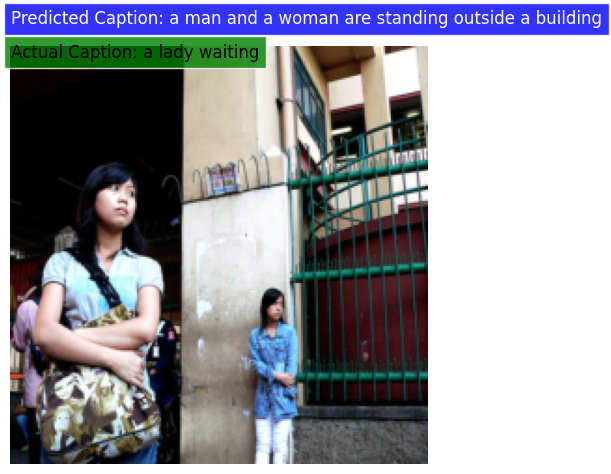

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_captions(image, predicted_caption, real_caption):
    """Display an image with predicted and real captions."""
    
    # Denormalize the image tensor
    image[0] = image[0] * 0.229
    image[1] = image[1] * 0.224
    image[2] = image[2] * 0.225
    image[0] += 0.485
    image[1] += 0.456
    image[2] += 0.406
    
    # Convert the image tensor to a numpy array and transpose the dimensions
    image = image.numpy().transpose((1, 2, 0))
    
    # Display the image
    plt.imshow(image)
    
    # Add predicted caption box
    plt.text(
        0, -20, predicted_caption, color='white', backgroundcolor='blue',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='blue', alpha=0.8, edgecolor='white', pad=5)
    )
    
    # Add real caption box
    plt.text(
        0, -2, real_caption, color='black', backgroundcolor='green',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='green', alpha=0.8, edgecolor='white', pad=5)
    )
    
    plt.axis('off')
    plt.tight_layout()

# Define the test data transformations
test_transforms = T.Compose([
    T.Resize((224, 224)),  # Resize the images to the specified size
    T.ToTensor(),  # Convert the images to tensors
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # Normalize the image tensors
])

# Create the test dataset
test_dataset = FlickrDataset(
    root_dir="Images",  # Root directory of the dataset
    caption_file="captions.txt",  # File containing the captions
    transform=test_transforms,  # Apply the specified transformations to the images
    frequency_threshold=1,  # Frequency threshold for filtering captions
    data_type='test'  # Specify the type of data (in this case, 'test')
)

# Create the test data loader
test_loader = DataLoader(
    dataset=test_dataset,  # Use the created test dataset
    batch_size=BATCH_SIZE,  # Number of samples per batch
    num_workers=NUM_WORKERS,  # Number of worker threads for data loading
    shuffle=True,  # Shuffle the data for each epoch
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)  # Function to collate and preprocess the data
)

# Get a batch of images and captions from the test loader
images, captions = next(iter(test_loader))

# Iterate over a single image and its captions
for i in range(1):
    # Set the model to evaluation mode
    NoFreeze_model.eval()
    
    # Get a single test image and create a clone
    test_image = torch.clone(images)[i].unsqueeze(0)
    
    # Disable gradient calculation during inference
    with torch.no_grad():
        # Encode the test image using the model's encoder
        features = NoFreeze_model.encoder(test_image[0:1].to(device))
        
        # Generate captions for the test image using the model's decoder
        predicted_captions = NoFreeze_model.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
        
        # Get the ground truth caption for the test image
        cap = torch.clone(captions)[i]
        caption_label = [test_dataset.vocab.itos[token] for token in cap.tolist()]
        
        # Find the index of the end-of-sequence token '<EOS>' in the caption
        eos_index = caption_label.index('<EOS>')
        
        # Extract the caption tokens from the start to the '<EOS>' token
        caption_label = caption_label[1:eos_index]
        
        # Convert the caption tokens to a string
        caption_label = ' '.join(caption_label)
        
        # Create the predicted caption string with proper formatting
        predicted_caption = "Predicted Caption: " + ' '.join(predicted_captions[1:len(predicted_captions)-1])
        
        # Create the actual caption string with proper formatting
        real_caption = "Actual Caption: " + caption_label
        
        # Display the image with the predicted and real captions
        show_image_with_captions(test_image[0], predicted_caption, real_caption)

# Save the plot as a PDF file
plt.savefig("testimagecaptions24.pdf", format='pdf', bbox_inches='tight')


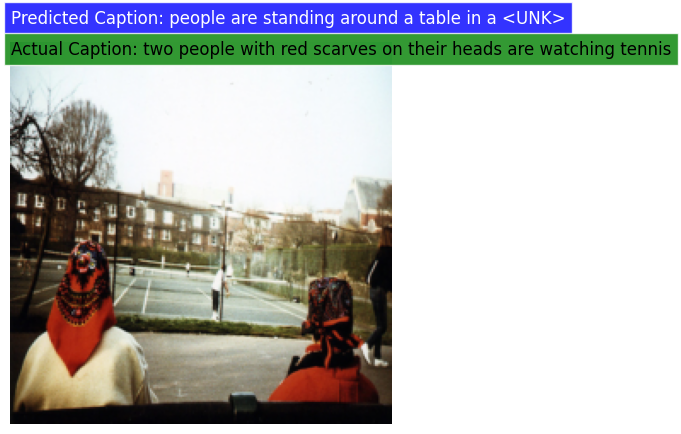

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_captions(image, predicted_caption, real_caption):
    """Display an image with predicted and real captions."""
    
    # Denormalize the image tensor
    image[0] = image[0] * 0.229
    image[1] = image[1] * 0.224
    image[2] = image[2] * 0.225
    image[0] += 0.485
    image[1] += 0.456
    image[2] += 0.406
    
    # Convert the image tensor to a numpy array and transpose the dimensions
    image = image.numpy().transpose((1, 2, 0))
    
    # Display the image
    plt.imshow(image)
    
    # Add predicted caption box
    plt.text(
        0, -20, predicted_caption, color='white', backgroundcolor='blue',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='blue', alpha=0.8, edgecolor='white', pad=5)
    )
    
    # Add real caption box
    plt.text(
        0, -2, real_caption, color='black', backgroundcolor='green',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='green', alpha=0.8, edgecolor='white', pad=5)
    )
    
    plt.axis('off')
    plt.tight_layout()

# Define the test data transformations
test_transforms = T.Compose([
    T.Resize((224, 224)),  # Resize the images to the specified size
    T.ToTensor(),  # Convert the images to tensors
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # Normalize the image tensors
])

# Create the test dataset
test_dataset = FlickrDataset(
    root_dir="Images",  # Root directory of the dataset
    caption_file="captions.txt",  # File containing the captions
    transform=test_transforms,  # Apply the specified transformations to the images
    frequency_threshold=1,  # Frequency threshold for filtering captions
    data_type='test'  # Specify the type of data (in this case, 'test')
)

# Create the test data loader
test_loader = DataLoader(
    dataset=test_dataset,  # Use the created test dataset
    batch_size=BATCH_SIZE,  # Number of samples per batch
    num_workers=NUM_WORKERS,  # Number of worker threads for data loading
    shuffle=True,  # Shuffle the data for each epoch
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)  # Function to collate and preprocess the data
)

# Get a batch of images and captions from the test loader
images, captions = next(iter(test_loader))

# Iterate over a single image and its captions
for i in range(1):
    # Set the model to evaluation mode
    NoFreeze_model.eval()
    
    # Get a single test image and create a clone
    test_image = torch.clone(images)[i].unsqueeze(0)
    
    # Disable gradient calculation during inference
    with torch.no_grad():
        # Encode the test image using the model's encoder
        features = NoFreeze_model.encoder(test_image[0:1].to(device))
        
        # Generate captions for the test image using the model's decoder
        predicted_captions = NoFreeze_model.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
        
        # Get the ground truth caption for the test image
        cap = torch.clone(captions)[i]
        caption_label = [test_dataset.vocab.itos[token] for token in cap.tolist()]
        
        # Find the index of the end-of-sequence token '<EOS>' in the caption
        eos_index = caption_label.index('<EOS>')
        
        # Extract the caption tokens from the start to the '<EOS>' token
        caption_label = caption_label[1:eos_index]
        
        # Convert the caption tokens to a string
        caption_label = ' '.join(caption_label)
        
        # Create the predicted caption string with proper formatting
        predicted_caption = "Predicted Caption: " + ' '.join(predicted_captions[1:len(predicted_captions)-1])
        
        # Create the actual caption string with proper formatting
        real_caption = "Actual Caption: " + caption_label
        
        # Display the image with the predicted and real captions
        show_image_with_captions(test_image[0], predicted_caption, real_caption)

# Save the plot as a PDF file
plt.savefig("testimagecaptions25.pdf", format='pdf', bbox_inches='tight')


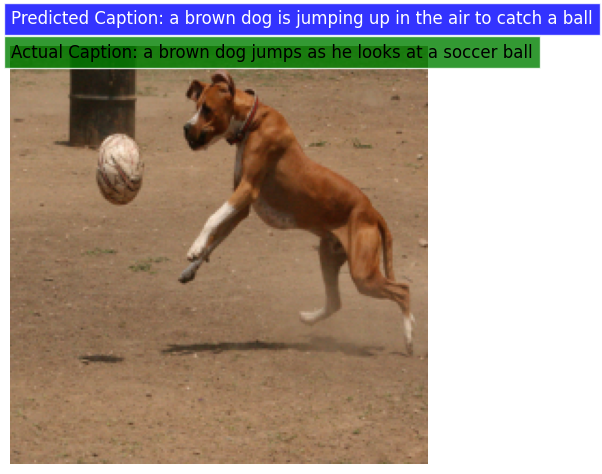

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_captions(image, predicted_caption, real_caption):
    """Display an image with predicted and real captions."""
    
    # Denormalize the image tensor
    image[0] = image[0] * 0.229
    image[1] = image[1] * 0.224
    image[2] = image[2] * 0.225
    image[0] += 0.485
    image[1] += 0.456
    image[2] += 0.406
    
    # Convert the image tensor to a numpy array and transpose the dimensions
    image = image.numpy().transpose((1, 2, 0))
    
    # Display the image
    plt.imshow(image)
    
    # Add predicted caption box
    plt.text(
        0, -20, predicted_caption, color='white', backgroundcolor='blue',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='blue', alpha=0.8, edgecolor='white', pad=5)
    )
    
    # Add real caption box
    plt.text(
        0, -2, real_caption, color='black', backgroundcolor='green',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='green', alpha=0.8, edgecolor='white', pad=5)
    )
    
    plt.axis('off')
    plt.tight_layout()

# Define the test data transformations
test_transforms = T.Compose([
    T.Resize((224, 224)),  # Resize the images to the specified size
    T.ToTensor(),  # Convert the images to tensors
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # Normalize the image tensors
])

# Create the test dataset
test_dataset = FlickrDataset(
    root_dir="Images",  # Root directory of the dataset
    caption_file="captions.txt",  # File containing the captions
    transform=test_transforms,  # Apply the specified transformations to the images
    frequency_threshold=1,  # Frequency threshold for filtering captions
    data_type='test'  # Specify the type of data (in this case, 'test')
)

# Create the test data loader
test_loader = DataLoader(
    dataset=test_dataset,  # Use the created test dataset
    batch_size=BATCH_SIZE,  # Number of samples per batch
    num_workers=NUM_WORKERS,  # Number of worker threads for data loading
    shuffle=True,  # Shuffle the data for each epoch
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)  # Function to collate and preprocess the data
)

# Get a batch of images and captions from the test loader
images, captions = next(iter(test_loader))

# Iterate over a single image and its captions
for i in range(1):
    # Set the model to evaluation mode
    NoFreeze_model.eval()
    
    # Get a single test image and create a clone
    test_image = torch.clone(images)[i].unsqueeze(0)
    
    # Disable gradient calculation during inference
    with torch.no_grad():
        # Encode the test image using the model's encoder
        features = NoFreeze_model.encoder(test_image[0:1].to(device))
        
        # Generate captions for the test image using the model's decoder
        predicted_captions = NoFreeze_model.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
        
        # Get the ground truth caption for the test image
        cap = torch.clone(captions)[i]
        caption_label = [test_dataset.vocab.itos[token] for token in cap.tolist()]
        
        # Find the index of the end-of-sequence token '<EOS>' in the caption
        eos_index = caption_label.index('<EOS>')
        
        # Extract the caption tokens from the start to the '<EOS>' token
        caption_label = caption_label[1:eos_index]
        
        # Convert the caption tokens to a string
        caption_label = ' '.join(caption_label)
        
        # Create the predicted caption string with proper formatting
        predicted_caption = "Predicted Caption: " + ' '.join(predicted_captions[1:len(predicted_captions)-1])
        
        # Create the actual caption string with proper formatting
        real_caption = "Actual Caption: " + caption_label
        
        # Display the image with the predicted and real captions
        show_image_with_captions(test_image[0], predicted_caption, real_caption)

# Save the plot as a PDF file
plt.savefig("testimagecaptions26.pdf", format='pdf', bbox_inches='tight')


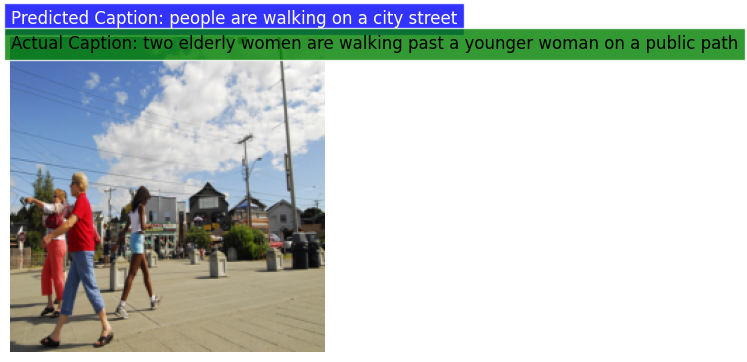

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_captions(image, predicted_caption, real_caption):
    """Display an image with predicted and real captions."""
    
    # Denormalize the image tensor
    image[0] = image[0] * 0.229
    image[1] = image[1] * 0.224
    image[2] = image[2] * 0.225
    image[0] += 0.485
    image[1] += 0.456
    image[2] += 0.406
    
    # Convert the image tensor to a numpy array and transpose the dimensions
    image = image.numpy().transpose((1, 2, 0))
    
    # Display the image
    plt.imshow(image)
    
    # Add predicted caption box
    plt.text(
        0, -20, predicted_caption, color='white', backgroundcolor='blue',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='blue', alpha=0.8, edgecolor='white', pad=5)
    )
    
    # Add real caption box
    plt.text(
        0, -2, real_caption, color='black', backgroundcolor='green',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='green', alpha=0.8, edgecolor='white', pad=5)
    )
    
    plt.axis('off')
    plt.tight_layout()

# Define the test data transformations
test_transforms = T.Compose([
    T.Resize((224, 224)),  # Resize the images to the specified size
    T.ToTensor(),  # Convert the images to tensors
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # Normalize the image tensors
])

# Create the test dataset
test_dataset = FlickrDataset(
    root_dir="Images",  # Root directory of the dataset
    caption_file="captions.txt",  # File containing the captions
    transform=test_transforms,  # Apply the specified transformations to the images
    frequency_threshold=1,  # Frequency threshold for filtering captions
    data_type='test'  # Specify the type of data (in this case, 'test')
)

# Create the test data loader
test_loader = DataLoader(
    dataset=test_dataset,  # Use the created test dataset
    batch_size=BATCH_SIZE,  # Number of samples per batch
    num_workers=NUM_WORKERS,  # Number of worker threads for data loading
    shuffle=True,  # Shuffle the data for each epoch
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)  # Function to collate and preprocess the data
)

# Get a batch of images and captions from the test loader
images, captions = next(iter(test_loader))

# Iterate over a single image and its captions
for i in range(1):
    # Set the model to evaluation mode
    NoFreeze_model.eval()
    
    # Get a single test image and create a clone
    test_image = torch.clone(images)[i].unsqueeze(0)
    
    # Disable gradient calculation during inference
    with torch.no_grad():
        # Encode the test image using the model's encoder
        features = NoFreeze_model.encoder(test_image[0:1].to(device))
        
        # Generate captions for the test image using the model's decoder
        predicted_captions = NoFreeze_model.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
        
        # Get the ground truth caption for the test image
        cap = torch.clone(captions)[i]
        caption_label = [test_dataset.vocab.itos[token] for token in cap.tolist()]
        
        # Find the index of the end-of-sequence token '<EOS>' in the caption
        eos_index = caption_label.index('<EOS>')
        
        # Extract the caption tokens from the start to the '<EOS>' token
        caption_label = caption_label[1:eos_index]
        
        # Convert the caption tokens to a string
        caption_label = ' '.join(caption_label)
        
        # Create the predicted caption string with proper formatting
        predicted_caption = "Predicted Caption: " + ' '.join(predicted_captions[1:len(predicted_captions)-1])
        
        # Create the actual caption string with proper formatting
        real_caption = "Actual Caption: " + caption_label
        
        # Display the image with the predicted and real captions
        show_image_with_captions(test_image[0], predicted_caption, real_caption)

# Save the plot as a PDF file
plt.savefig("testimagecaptions27.pdf", format='pdf', bbox_inches='tight')


## **Train (+ Val)**

In [ ]:
#ResNet Model
class ResNet(nn.Module):
    def __init__(self, embed_size, train_resnet=False):
        """
        Initialize the ResNet model with a specified embedding size.
        
        Args:
            embed_size (int): Size of the embedding output.
            train_resnet (bool): Whether to train the ResNet backbone or not.
        """
        super(ResNet, self).__init__()
        
        # Load the pretrained ResNet-18 model
        resnet = models.resnet18(pretrained=True)
        
        # Set the requires_grad flag of the ResNet parameters
        # to control whether they are trainable or not
        for param in resnet.parameters():
            param.requires_grad_(train_resnet)
        
        # Extract the modules of the ResNet model up to the last fully connected layer
        modules = list(resnet.children())[:-1]
        
        # Create the ResNet backbone with the extracted modules
        self.resnet = nn.Sequential(*modules)
        
        # Create the embedding layer
        self.embed = nn.Linear(resnet.fc.in_features, embed_size)
        
        # Activation function and dropout layer
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)

    def forward(self, images):
        """
        Forward pass of the ResNet model.
        
        Args:
            images (tensor): Input images tensor.
        
        Returns:
            features (tensor): Embedded features tensor.
        """
        features = self.dropout(self.relu(self.resnet(images)))
        features = features.view(features.size(0), -1)
        features = self.embed(features)
        return features

# LSTM Network
class LSTM(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1, drop_prob=0.5):
        """
        Initialize the LSTM model with specified sizes and parameters.
        
        Args:
            embed_size (int): Size of the word embedding.
            hidden_size (int): Size of the hidden state of the LSTM.
            vocab_size (int): Size of the vocabulary.
            num_layers (int): Number of layers in the LSTM (default: 1).
            drop_prob (float): Dropout probability (default: 0.5).
        """
        super().__init__()
        
        # Word embedding layer
        self.embedding = nn.Embedding(vocab_size, embed_size)
        
        # LSTM layer
        self.lstm = nn.LSTM(embed_size, hidden_size, num_layers=num_layers, batch_first=True)
        
        # Linear layer for prediction
        self.linear = nn.Linear(hidden_size, vocab_size)
        
        # Dropout layer
        self.dropout = nn.Dropout(drop_prob)
    
    def forward(self, features, captions):
        """
        Forward pass of the LSTM model.
        
        Args:
            features (tensor): Image features tensor.
            captions (tensor): Captions tensor.
        
        Returns:
            x (tensor): Output tensor.
        """
        # Vectorize the caption by passing it through the embedding layer
        embeds = self.dropout(self.embedding(captions[:, :-1]))
        
        # Concatenate the features and captions
        x = torch.cat((features.unsqueeze(1), embeds), dim=1) 
        
        # Pass through the LSTM layer
        x, _ = self.lstm(x)
        
        # Pass through the linear layer for prediction
        x = self.linear(x)
        
        return x

    def generate_caption(self, inputs, hidden=None, max_len=20, vocab=None):
        """
        Generate captions given the image features.
        
        Args:
            inputs (tensor): Input tensor of image features.
            hidden (tuple): Hidden state of the LSTM (default: None).
            max_len (int): Maximum length of the generated caption (default: 20).
            vocab (Vocab): Vocabulary object (default: None).
        
        Returns:
            caption (list): Generated caption as a list of words.
        """
        # Inference part
        # Given the image features, generate the captions
        
        batch_size = inputs.size(0)
        
        captions = []
        
        for i in range(max_len):
            output, hidden = self.lstm(inputs, hidden)
            output = self.linear(output)
            output = output.view(batch_size, -1)
        
            # Select the word with the highest value
            predicted_word_idx = output.argmax(dim=1)
            
            # Save the generated word
            captions.append(predicted_word_idx.item())
            
            # End if <EOS> is detected
            if vocab.itos[predicted_word_idx.item()] == "<EOS>":
                break
            
            # Send the generated word as the next caption
            inputs = self.embedding(predicted_word_idx.unsqueeze(0))
        
        # Convert the vocabulary indices to words and return the sentence
        return [vocab.itos[idx] for idx in captions]

# Utilizing the powerful fusion of ResNet and LSTM for image captioning
class CNNtoRNN(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1, drop_prob=0.5, train_resnet=False):
        """
        Initialize the CNNtoRNN model with specified sizes and parameters.
        
        Args:
            embed_size (int): Size of the word embedding.
            hidden_size (int): Size of the hidden state of the LSTM.
            vocab_size (int): Size of the vocabulary.
            num_layers (int): Number of layers in the LSTM (default: 1).
            drop_prob (float): Dropout probability (default: 0.5).
            train_resnet (bool): Whether to train the ResNet backbone or not (default: False).
        """
        super().__init__()
        
        # Encoder (ResNet)
        self.encoder = ResNet(embed_size, train_resnet)
        
        # Decoder (LSTM)
        self.decoder = LSTM(embed_size, hidden_size, vocab_size, num_layers, drop_prob)
    
    def forward(self, images, captions):
        """
        Forward pass of the CNNtoRNN model.
        
        Args:
            images (tensor): Input images tensor.
            captions (tensor): Captions tensor.
        
        Returns:
            outputs (tensor): Output tensor.
        """
        # Pass the images through the encoder (ResNet) to get features
        features = self.encoder(images)
        
        # Pass the features and captions through the decoder (LSTM) to get outputs
        outputs = self.decoder(features, captions)
        
        return outputs


In [ ]:
# Check if a CUDA-enabled GPU is available
# If available, set the device to "cuda" for GPU computations
# If not available, set the device to "cpu" for CPU computations
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

# Hyperparameters for the model
embed_size = 128  # Size of the word embedding
hidden_size = 256  # Size of the hidden state in the LSTM
vocab_size = len(train_dataset.vocab)  # Size of the vocabulary
num_layers = 1  # Number of layers in the LSTM
learning_rate = 3e-4  # Learning rate for the optimizer

# Initialize the model, loss function, and optimizer
model = CNNtoRNN(embed_size, hidden_size, vocab_size, num_layers, train_resnet=True).to(device)
criterion = nn.CrossEntropyLoss(ignore_index=train_dataset.vocab.stoi["<PAD>"])
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

Epoch: 1 - Train Loss: 5.3771 - Val Loss: 4.4535
Epoch: 2 - Train Loss: 4.2334 - Val Loss: 4.0585
Epoch: 3 - Train Loss: 3.9376 - Val Loss: 3.8271
Epoch: 4 - Train Loss: 3.7595 - Val Loss: 3.6771
Epoch: 5 - Train Loss: 3.6335 - Val Loss: 3.5657
Epoch: 6 - Train Loss: 3.5306 - Val Loss: 3.4786
Epoch: 7 - Train Loss: 3.4297 - Val Loss: 3.3878
Epoch: 8 - Train Loss: 3.3425 - Val Loss: 3.3038
Epoch: 9 - Train Loss: 3.2663 - Val Loss: 3.2342
Epoch: 10 - Train Loss: 3.1992 - Val Loss: 3.1914
Epoch: 11 - Train Loss: 3.1426 - Val Loss: 3.1393
Epoch: 12 - Train Loss: 3.0863 - Val Loss: 3.1057
Epoch: 13 - Train Loss: 3.0391 - Val Loss: 3.0670
Epoch: 14 - Train Loss: 2.9936 - Val Loss: 3.0375
Epoch: 15 - Train Loss: 2.9520 - Val Loss: 3.0094
Epoch: 16 - Train Loss: 2.9135 - Val Loss: 2.9831
Epoch: 17 - Train Loss: 2.8777 - Val Loss: 2.9597
Epoch: 18 - Train Loss: 2.8440 - Val Loss: 2.9365
Epoch: 19 - Train Loss: 2.8118 - Val Loss: 2.9210
Epoch: 20 - Train Loss: 2.7802 - Val Loss: 2.9035


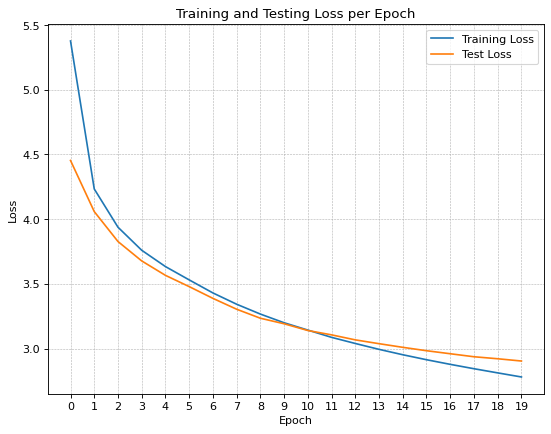

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as T
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Set the batch size, number of workers, and pad index
BATCH_SIZE = 256
NUM_WORKERS = 10
pad_idx = train_dataset.vocab.stoi["<PAD>"]

# Define the transformations to be applied, including resizing, random cropping,
# converting to tensor, and normalization using ResNet statistics
transforms = T.Compose([
    T.Resize(256),
    T.RandomCrop(224),
    T.ToTensor(),
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])

# Create an instance of the FlickrDataset for training
train_dataset = FlickrDataset(
    root_dir="/content/Dataset/Images",
    caption_file="captions.txt",
    transform=transforms,
    data_type='train'
)

# Split the dataset into training and validation sets
train_dataset, val_dataset = train_test_split(train_dataset, test_size=0.1, random_state=42)

# Create a DataLoader for the training dataset
train_loader = DataLoader(
    dataset=train_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    shuffle=True,
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)
)

# Create a DataLoader for the validation dataset
val_loader = DataLoader(
    dataset=val_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    shuffle=False,
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)
)

# Set the number of training epochs
num_epochs = 20

# Create empty lists to store the training and validation loss
train_loss = []
val_loss = []

# Training loop
for epoch in range(num_epochs):
    running_train_loss = 0
    running_val_loss = 0
    
    # Training
    model.train()
    for idx, (image, captions) in enumerate(train_loader):
        image, captions = image.to(device), captions.to(device)
        optimizer.zero_grad()
        outputs = model(image, captions)
        loss = criterion(outputs.view(-1, vocab_size), captions.view(-1))
        loss.backward()
        optimizer.step()
        running_train_loss += loss.item()
    average_train_loss = running_train_loss / len(train_loader)
    train_loss.append(average_train_loss)
    
    # Validation
    model.eval()
    with torch.no_grad():
        for idx, (image, captions) in enumerate(val_loader):
            image, captions = image.to(device), captions.to(device)
            outputs = model(image, captions)
            loss = criterion(outputs.view(-1, vocab_size), captions.view(-1))
            running_val_loss += loss.item()
    average_val_loss = running_val_loss / len(val_loader)
    val_loss.append(average_val_loss)
    
    print(f'Epoch: {epoch+1} - Train Loss: {average_train_loss:.4f} - Val Loss: {average_val_loss:.4f}')
    
    # Save the model after each epoch
    torch.save(model.cpu().state_dict(), 'ModelwithValNoFreeze.pth')
    model.cuda()

# Plotting the training and validation loss
plt.figure(figsize=(8, 6), dpi=80)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Test Loss')
plt.title("Training and Testing Loss per Epoch")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(True, linestyle='--', linewidth=0.5)
plt.xticks(range(num_epochs))
plt.legend()
plt.savefig("lossplotwithval2.pdf", format='pdf', bbox_inches='tight')
plt.show()

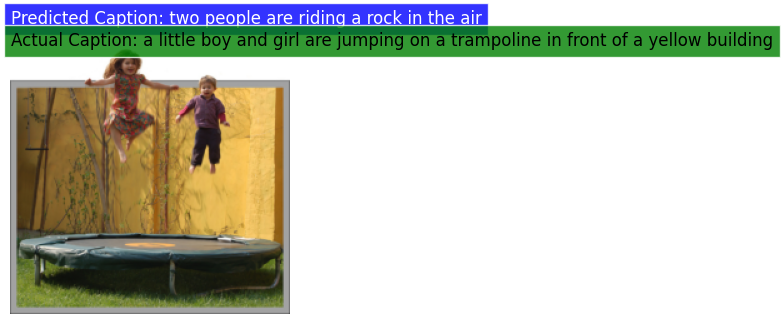

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_captions(image, predicted_caption, real_caption):
    """Display an image with predicted and real captions."""
    
    # Denormalize the image tensor
    image[0] = image[0] * 0.229
    image[1] = image[1] * 0.224
    image[2] = image[2] * 0.225
    image[0] += 0.485
    image[1] += 0.456
    image[2] += 0.406
    
    # Convert the image tensor to a numpy array and transpose the dimensions
    image = image.numpy().transpose((1, 2, 0))
    
    # Display the image
    plt.imshow(image)
    
    # Add predicted caption box
    plt.text(
        0, -20, predicted_caption, color='white', backgroundcolor='blue',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='blue', alpha=0.8, edgecolor='white', pad=5)
    )
    
    # Add real caption box
    plt.text(
        0, -2, real_caption, color='black', backgroundcolor='green',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='green', alpha=0.8, edgecolor='white', pad=5)
    )
    
    plt.axis('off')
    plt.tight_layout()

# Define the test data transformations
test_transforms = T.Compose([
    T.Resize((224, 224)),  # Resize the images to the specified size
    T.ToTensor(),  # Convert the images to tensors
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # Normalize the image tensors
])

# Create the test dataset
test_dataset = FlickrDataset(
    root_dir="Images",  # Root directory of the dataset
    caption_file="captions.txt",  # File containing the captions
    transform=test_transforms,  # Apply the specified transformations to the images
    frequency_threshold=1,  # Frequency threshold for filtering captions
    data_type='test'  # Specify the type of data (in this case, 'test')
)

# Create the test data loader
test_loader = DataLoader(
    dataset=test_dataset,  # Use the created test dataset
    batch_size=BATCH_SIZE,  # Number of samples per batch
    num_workers=NUM_WORKERS,  # Number of worker threads for data loading
    shuffle=True,  # Shuffle the data for each epoch
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)  # Function to collate and preprocess the data
)

# Get a batch of images and captions from the test loader
images, captions = next(iter(test_loader))

# Iterate over a single image and its captions
for i in range(1):
    # Set the model to evaluation mode
    model.eval()
    
    # Get a single test image and create a clone
    test_image = torch.clone(images)[i].unsqueeze(0)
    
    # Disable gradient calculation during inference
    with torch.no_grad():
        # Encode the test image using the model's encoder
        features = model.encoder(test_image[0:1].to(device))
        
        # Generate captions for the test image using the model's decoder
        predicted_captions = model.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
        
        # Get the ground truth caption for the test image
        cap = torch.clone(captions)[i]
        caption_label = [test_dataset.vocab.itos[token] for token in cap.tolist()]
        
        # Find the index of the end-of-sequence token '<EOS>' in the caption
        eos_index = caption_label.index('<EOS>')
        
        # Extract the caption tokens from the start to the '<EOS>' token
        caption_label = caption_label[1:eos_index]
        
        # Convert the caption tokens to a string
        caption_label = ' '.join(caption_label)
        
        # Create the predicted caption string with proper formatting
        predicted_caption = "Predicted Caption: " + ' '.join(predicted_captions[1:len(predicted_captions)-1])
        
        # Create the actual caption string with proper formatting
        real_caption = "Actual Caption: " + caption_label
        
        # Display the image with the predicted and real captions
        show_image_with_captions(test_image[0], predicted_caption, real_caption)

# Save the plot as a PDF file
plt.savefig("testimagecaptionsval21.pdf", format='pdf', bbox_inches='tight')


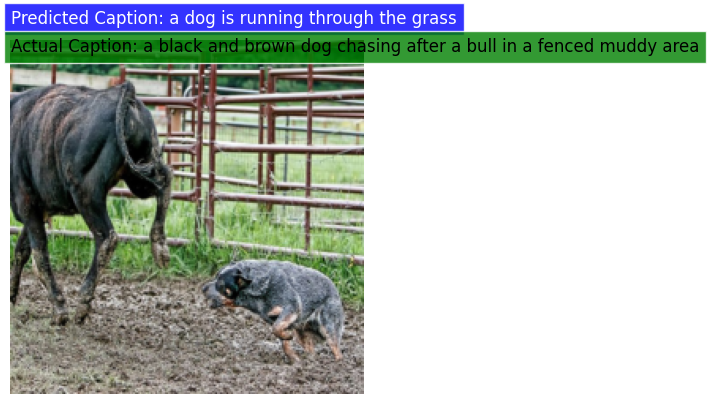

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_captions(image, predicted_caption, real_caption):
    """Display an image with predicted and real captions."""
    
    # Denormalize the image tensor
    image[0] = image[0] * 0.229
    image[1] = image[1] * 0.224
    image[2] = image[2] * 0.225
    image[0] += 0.485
    image[1] += 0.456
    image[2] += 0.406
    
    # Convert the image tensor to a numpy array and transpose the dimensions
    image = image.numpy().transpose((1, 2, 0))
    
    # Display the image
    plt.imshow(image)
    
    # Add predicted caption box
    plt.text(
        0, -20, predicted_caption, color='white', backgroundcolor='blue',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='blue', alpha=0.8, edgecolor='white', pad=5)
    )
    
    # Add real caption box
    plt.text(
        0, -2, real_caption, color='black', backgroundcolor='green',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='green', alpha=0.8, edgecolor='white', pad=5)
    )
    
    plt.axis('off')
    plt.tight_layout()

# Define the test data transformations
test_transforms = T.Compose([
    T.Resize((224, 224)),  # Resize the images to the specified size
    T.ToTensor(),  # Convert the images to tensors
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # Normalize the image tensors
])

# Create the test dataset
test_dataset = FlickrDataset(
    root_dir="Images",  # Root directory of the dataset
    caption_file="captions.txt",  # File containing the captions
    transform=test_transforms,  # Apply the specified transformations to the images
    frequency_threshold=1,  # Frequency threshold for filtering captions
    data_type='test'  # Specify the type of data (in this case, 'test')
)

# Create the test data loader
test_loader = DataLoader(
    dataset=test_dataset,  # Use the created test dataset
    batch_size=BATCH_SIZE,  # Number of samples per batch
    num_workers=NUM_WORKERS,  # Number of worker threads for data loading
    shuffle=True,  # Shuffle the data for each epoch
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)  # Function to collate and preprocess the data
)

# Get a batch of images and captions from the test loader
images, captions = next(iter(test_loader))

# Iterate over a single image and its captions
for i in range(1):
    # Set the model to evaluation mode
    model.eval()
    
    # Get a single test image and create a clone
    test_image = torch.clone(images)[i].unsqueeze(0)
    
    # Disable gradient calculation during inference
    with torch.no_grad():
        # Encode the test image using the model's encoder
        features = model.encoder(test_image[0:1].to(device))
        
        # Generate captions for the test image using the model's decoder
        predicted_captions = model.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
        
        # Get the ground truth caption for the test image
        cap = torch.clone(captions)[i]
        caption_label = [test_dataset.vocab.itos[token] for token in cap.tolist()]
        
        # Find the index of the end-of-sequence token '<EOS>' in the caption
        eos_index = caption_label.index('<EOS>')
        
        # Extract the caption tokens from the start to the '<EOS>' token
        caption_label = caption_label[1:eos_index]
        
        # Convert the caption tokens to a string
        caption_label = ' '.join(caption_label)
        
        # Create the predicted caption string with proper formatting
        predicted_caption = "Predicted Caption: " + ' '.join(predicted_captions[1:len(predicted_captions)-1])
        
        # Create the actual caption string with proper formatting
        real_caption = "Actual Caption: " + caption_label
        
        # Display the image with the predicted and real captions
        show_image_with_captions(test_image[0], predicted_caption, real_caption)

# Save the plot as a PDF file
plt.savefig("testimagecaptionsval22.pdf", format='pdf', bbox_inches='tight')


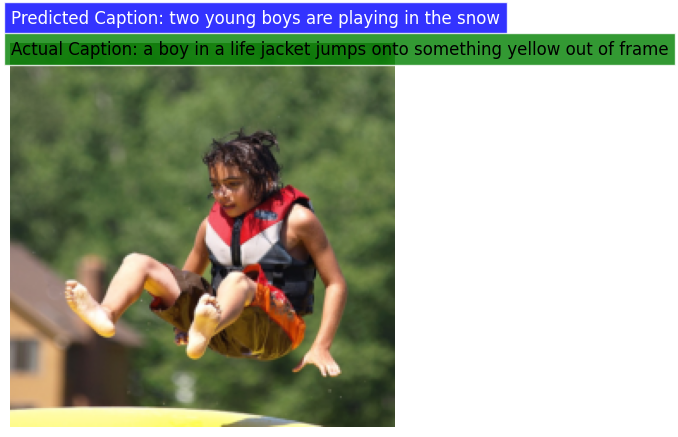

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_captions(image, predicted_caption, real_caption):
    """Display an image with predicted and real captions."""
    
    # Denormalize the image tensor
    image[0] = image[0] * 0.229
    image[1] = image[1] * 0.224
    image[2] = image[2] * 0.225
    image[0] += 0.485
    image[1] += 0.456
    image[2] += 0.406
    
    # Convert the image tensor to a numpy array and transpose the dimensions
    image = image.numpy().transpose((1, 2, 0))
    
    # Display the image
    plt.imshow(image)
    
    # Add predicted caption box
    plt.text(
        0, -20, predicted_caption, color='white', backgroundcolor='blue',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='blue', alpha=0.8, edgecolor='white', pad=5)
    )
    
    # Add real caption box
    plt.text(
        0, -2, real_caption, color='black', backgroundcolor='green',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='green', alpha=0.8, edgecolor='white', pad=5)
    )
    
    plt.axis('off')
    plt.tight_layout()

# Define the test data transformations
test_transforms = T.Compose([
    T.Resize((224, 224)),  # Resize the images to the specified size
    T.ToTensor(),  # Convert the images to tensors
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # Normalize the image tensors
])

# Create the test dataset
test_dataset = FlickrDataset(
    root_dir="Images",  # Root directory of the dataset
    caption_file="captions.txt",  # File containing the captions
    transform=test_transforms,  # Apply the specified transformations to the images
    frequency_threshold=1,  # Frequency threshold for filtering captions
    data_type='test'  # Specify the type of data (in this case, 'test')
)

# Create the test data loader
test_loader = DataLoader(
    dataset=test_dataset,  # Use the created test dataset
    batch_size=BATCH_SIZE,  # Number of samples per batch
    num_workers=NUM_WORKERS,  # Number of worker threads for data loading
    shuffle=True,  # Shuffle the data for each epoch
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)  # Function to collate and preprocess the data
)

# Get a batch of images and captions from the test loader
images, captions = next(iter(test_loader))

# Iterate over a single image and its captions
for i in range(1):
    # Set the model to evaluation mode
    model.eval()
    
    # Get a single test image and create a clone
    test_image = torch.clone(images)[i].unsqueeze(0)
    
    # Disable gradient calculation during inference
    with torch.no_grad():
        # Encode the test image using the model's encoder
        features = model.encoder(test_image[0:1].to(device))
        
        # Generate captions for the test image using the model's decoder
        predicted_captions = model.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
        
        # Get the ground truth caption for the test image
        cap = torch.clone(captions)[i]
        caption_label = [test_dataset.vocab.itos[token] for token in cap.tolist()]
        
        # Find the index of the end-of-sequence token '<EOS>' in the caption
        eos_index = caption_label.index('<EOS>')
        
        # Extract the caption tokens from the start to the '<EOS>' token
        caption_label = caption_label[1:eos_index]
        
        # Convert the caption tokens to a string
        caption_label = ' '.join(caption_label)
        
        # Create the predicted caption string with proper formatting
        predicted_caption = "Predicted Caption: " + ' '.join(predicted_captions[1:len(predicted_captions)-1])
        
        # Create the actual caption string with proper formatting
        real_caption = "Actual Caption: " + caption_label
        
        # Display the image with the predicted and real captions
        show_image_with_captions(test_image[0], predicted_caption, real_caption)

# Save the plot as a PDF file
plt.savefig("testimagecaptionsval23.pdf", format='pdf', bbox_inches='tight')


# **3. Utilize a ResNet model (without freezing + Bidirectional LSTM) for efficient feature extraction, while fine-tuning the last linear layer.**

## **Train**

### **Generate data loaders**

In [ ]:
BATCH_SIZE = 256
NUM_WORKERS = 10
pad_idx = train_dataset.vocab.stoi["<PAD>"]

# Define the transformations to be applied, including resizing, random cropping,
# converting to tensor, and normalization using ResNet statistics
transforms = T.Compose([
    T.Resize(256),
    T.RandomCrop(224),
    T.ToTensor(),
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])

# Create an instance of the FlickrDataset for training
train_dataset = FlickrDataset(
    root_dir="/content/Dataset/Images",
    caption_file="captions.txt",
    transform=transforms,
    data_type='train'
)

# Create a DataLoader for the training dataset
train_loader = DataLoader(
    dataset=train_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    shuffle=True,
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)
)


### **Model**

In [ ]:
#ResNet Model
class ResNet(nn.Module):
    def __init__(self, embed_size, train_resnet=False):
        """
        Initialize the ResNet model with a specified embedding size.
        
        Args:
            embed_size (int): Size of the embedding output.
            train_resnet (bool): Whether to train the ResNet backbone or not.
        """
        super(ResNet, self).__init__()
        
        # Load the pretrained ResNet-18 model
        resnet = models.resnet18(pretrained=True)
        
        # Set the requires_grad flag of the ResNet parameters
        # to control whether they are trainable or not
        for param in resnet.parameters():
            param.requires_grad_(train_resnet)
        
        # Extract the modules of the ResNet model up to the last fully connected layer
        modules = list(resnet.children())[:-1]
        
        # Create the ResNet backbone with the extracted modules
        self.resnet = nn.Sequential(*modules)
        
        # Create the embedding layer
        self.embed = nn.Linear(resnet.fc.in_features, embed_size)
        
        # Activation function and dropout layer
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)

    def forward(self, images):
        """
        Forward pass of the ResNet model.
        
        Args:
            images (tensor): Input images tensor.
        
        Returns:
            features (tensor): Embedded features tensor.
        """
        features = self.dropout(self.relu(self.resnet(images)))
        features = features.view(features.size(0), -1)
        features = self.embed(features)
        return features

# LSTM Network
class LSTM(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1, drop_prob=0.5):
        """
        Initialize the LSTM model with specified sizes and parameters.
        
        Args:
            embed_size (int): Size of the word embedding.
            hidden_size (int): Size of the hidden state of the LSTM.
            vocab_size (int): Size of the vocabulary.
            num_layers (int): Number of layers in the LSTM (default: 1).
            drop_prob (float): Dropout probability (default: 0.5).
        """
        super().__init__()
        
        # Word embedding layer
        self.embedding = nn.Embedding(vocab_size, embed_size)
        
        # LSTM layer
        self.lstm = nn.LSTM(embed_size, hidden_size, num_layers=num_layers, batch_first=True, bidirectional = True)
        
        # Linear layer for prediction
        self.linear = nn.Linear(hidden_size*2, vocab_size)
        
        # Dropout layer
        self.dropout = nn.Dropout(drop_prob)
    
    def forward(self, features, captions):
        """
        Forward pass of the LSTM model.
        
        Args:
            features (tensor): Image features tensor.
            captions (tensor): Captions tensor.
        
        Returns:
            x (tensor): Output tensor.
        """
        # Vectorize the caption by passing it through the embedding layer
        embeds = self.dropout(self.embedding(captions[:, :-1]))
        
        # Concatenate the features and captions
        x = torch.cat((features.unsqueeze(1), embeds), dim=1) 
        
        # Pass through the LSTM layer
        x, _ = self.lstm(x)
        
        # Pass through the linear layer for prediction
        x = self.linear(x)
        
        return x

    def generate_caption(self, inputs, hidden=None, max_len=20, vocab=None):
        """
        Generate captions given the image features.
        
        Args:
            inputs (tensor): Input tensor of image features.
            hidden (tuple): Hidden state of the LSTM (default: None).
            max_len (int): Maximum length of the generated caption (default: 20).
            vocab (Vocab): Vocabulary object (default: None).
        
        Returns:
            caption (list): Generated caption as a list of words.
        """
        # Inference part
        # Given the image features, generate the captions
        
        batch_size = inputs.size(0)
        
        captions = []
        
        for i in range(max_len):
            output, hidden = self.lstm(inputs, hidden)
            output = self.linear(output)
            output = output.view(batch_size, -1)
        
            # Select the word with the highest value
            predicted_word_idx = output.argmax(dim=1)
            
            # Save the generated word
            captions.append(predicted_word_idx.item())
            
            # End if <EOS> is detected
            if vocab.itos[predicted_word_idx.item()] == "<EOS>":
                break
            
            # Send the generated word as the next caption
            inputs = self.embedding(predicted_word_idx.unsqueeze(0))
        
        # Convert the vocabulary indices to words and return the sentence
        return [vocab.itos[idx] for idx in captions]

# Utilizing the powerful fusion of ResNet and LSTM for image captioning
class CNNtoRNN(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1, drop_prob=0.5, train_resnet=False):
        """
        Initialize the CNNtoRNN model with specified sizes and parameters.
        
        Args:
            embed_size (int): Size of the word embedding.
            hidden_size (int): Size of the hidden state of the LSTM.
            vocab_size (int): Size of the vocabulary.
            num_layers (int): Number of layers in the LSTM (default: 1).
            drop_prob (float): Dropout probability (default: 0.5).
            train_resnet (bool): Whether to train the ResNet backbone or not (default: False).
        """
        super().__init__()
        
        # Encoder (ResNet)
        self.encoder = ResNet(embed_size, train_resnet)
        
        # Decoder (LSTM)
        self.decoder = LSTM(embed_size, hidden_size, vocab_size, num_layers, drop_prob)
    
    def forward(self, images, captions):
        """
        Forward pass of the CNNtoRNN model.
        
        Args:
            images (tensor): Input images tensor.
            captions (tensor): Captions tensor.
        
        Returns:
            outputs (tensor): Output tensor.
        """
        # Pass the images through the encoder (ResNet) to get features
        features = self.encoder(images)
        
        # Pass the features and captions through the decoder (LSTM) to get outputs
        outputs = self.decoder(features, captions)
        
        return outputs


### **Train the Model**

In [ ]:
# Check if a CUDA-enabled GPU is available
# If available, set the device to "cuda" for GPU computations
# If not available, set the device to "cpu" for CPU computations
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

# Hyperparameters for the model
embed_size = 128  # Size of the word embedding
hidden_size = 256  # Size of the hidden state in the LSTM
vocab_size = len(train_dataset.vocab)  # Size of the vocabulary
num_layers = 1  # Number of layers in the LSTM
learning_rate = 3e-4  # Learning rate for the optimizer

# Initialize the model, loss function, and optimizer
NoFreeze_model_bi = CNNtoRNN(embed_size, hidden_size, vocab_size, num_layers, train_resnet=True).to(device)
criterion = nn.CrossEntropyLoss(ignore_index=train_dataset.vocab.stoi["<PAD>"])
optimizer = optim.Adam(NoFreeze_model_bi.parameters(), lr=learning_rate)

Epoch: 1 - Train Loss: 4.764396175637946
Epoch: 2 - Train Loss: 2.955980390935511
Epoch: 3 - Train Loss: 2.192415646739773
Epoch: 4 - Train Loss: 1.7028564723221573
Epoch: 5 - Train Loss: 1.3591378785513497
Epoch: 6 - Train Loss: 1.106173901707976
Epoch: 7 - Train Loss: 0.9153213192532946
Epoch: 8 - Train Loss: 0.7661450617796891
Epoch: 9 - Train Loss: 0.6474878558745751
Epoch: 10 - Train Loss: 0.5507056039946896
Epoch: 11 - Train Loss: 0.47095877682412424
Epoch: 12 - Train Loss: 0.40426545772519146
Epoch: 13 - Train Loss: 0.3495950815560934
Epoch: 14 - Train Loss: 0.3034269374150496
Epoch: 15 - Train Loss: 0.2644723845528556
Epoch: 16 - Train Loss: 0.23036092999098184
Epoch: 17 - Train Loss: 0.20257324980689095
Epoch: 18 - Train Loss: 0.17782175415879362
Epoch: 19 - Train Loss: 0.1565249682098002
Epoch: 20 - Train Loss: 0.1382495445700792
Epoch: 21 - Train Loss: 0.12208282926699499
Epoch: 22 - Train Loss: 0.10844990913267735
Epoch: 23 - Train Loss: 0.09631544533934626
Epoch: 24 - Trai

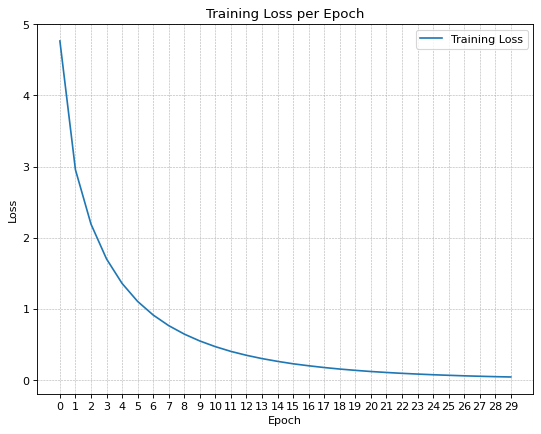

In [ ]:
scaler = torch.cuda.amp.GradScaler()

# Set the number of training epochs
num_epochs = 30

# Create an empty list to store the training loss
NoFreeze_train_loss_bi = []

# Training loop
for epoch in range(num_epochs):
    running_loss = 0
    
    # Iterate over the training data loader
    for idx, (image, captions) in enumerate(iter(train_loader)):
        # Move the image and captions to the specified device
        image, captions = image.to(device), captions.to(device)
        
        # Set the model to train mode
        NoFreeze_model_bi.train()
        
        # Zero the gradients in the optimizer
        optimizer.zero_grad()
        
        # Feed forward
        outputs = NoFreeze_model_bi(image, captions)
        
        # Calculate the batch loss
        loss = criterion(outputs.view(-1, vocab_size), captions.view(-1))
        
        # Backward pass
        scaler.scale(loss).backward()
        
        # Update the parameters in the optimizer
        scaler.step(optimizer) 
        scaler.update() 
        
        # Accumulate the running loss
        running_loss += loss.item()

    # Calculate the average loss for the epoch
    average_loss = running_loss / (idx + 1)
    
    # Print the epoch number and the average loss
    print(f'Epoch: {epoch+1} - Train Loss: {average_loss}')
    
    # Append the average loss to the train_loss list
    NoFreeze_train_loss_bi.append(average_loss)
    
    # Save the model after each epoch
    torch.save(NoFreeze_model_bi.cpu().state_dict(), 'NoFreezeModelbi.pth')
    
    # Move the model back to the specified device
    NoFreeze_model_bi.cuda()

import matplotlib.pyplot as plt

# Set the figure size and dpi for better quality
plt.figure(figsize=(8, 6), dpi=80)

# Plot the training loss
plt.plot(NoFreeze_train_loss_bi, label='Training Loss')

# Set the plot title and axis labels
plt.title("Training Loss per Epoch")
plt.xlabel("Epoch")
plt.ylabel("Loss")

# Customize the grid and ticks
plt.grid(True, linestyle='--', linewidth=0.5)
plt.xticks(range(len(NoFreeze_train_loss_bi)))
plt.yticks()

# Add a legend
plt.legend()

# Save the plot as a PDF file
plt.savefig("loss_plot.pdf", format='pdf', bbox_inches='tight')

# Show the plot
plt.show()



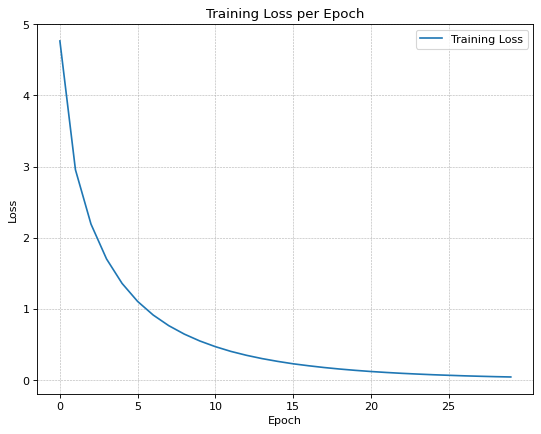

In [ ]:
import matplotlib.pyplot as plt

# Set the figure size and dpi for better quality
plt.figure(figsize=(8, 6), dpi=80)

# Plot the training loss
plt.plot(NoFreeze_train_loss_bi, label='Training Loss')

# Set the plot title and axis labels
plt.title("Training Loss per Epoch")
plt.xlabel("Epoch")
plt.ylabel("Loss")

# Customize the grid and ticks
plt.grid(True, linestyle='--', linewidth=0.5)
plt.xticks(range(0, len(NoFreeze_train_loss_bi), 5))  # Label every 5th epoch
plt.yticks()

# Add a legend
plt.legend()

# Save the plot as a PDF file
plt.savefig("lossplot3.pdf", format='pdf', bbox_inches='tight')

# Show the plot
plt.show()


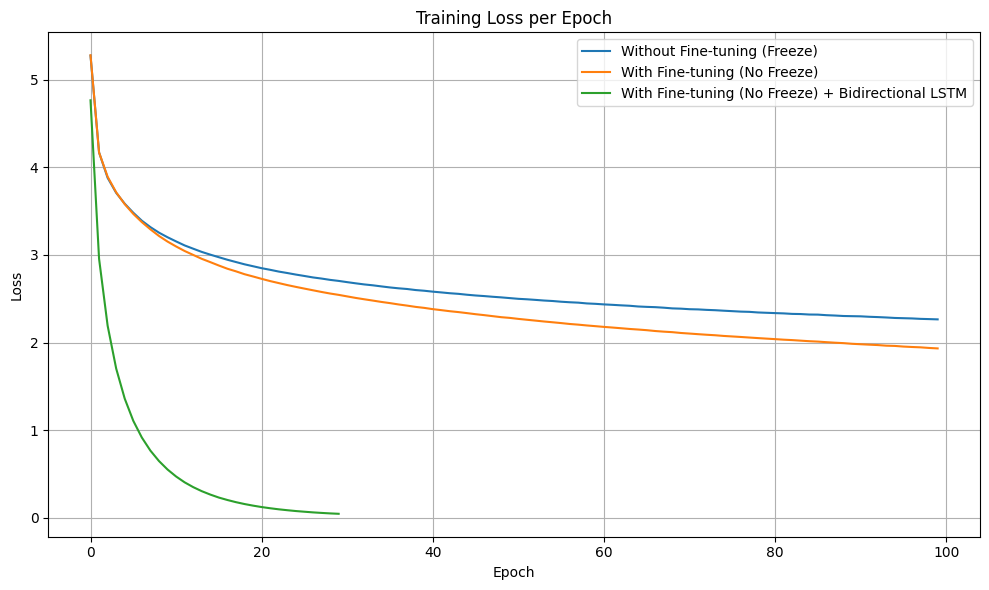

In [ ]:
# Import the necessary libraries
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(10, 6))

# Set the plot title and axis labels
plt.title("Training Loss per Epoch")
plt.xlabel("Epoch")
plt.ylabel("Loss")

# Plot the training loss curves
plt.plot(train_loss, label='Without Fine-tuning (Freeze)')
plt.plot(NoFreeze_train_loss, label='With Fine-tuning (No Freeze)')
plt.plot(NoFreeze_train_loss_bi, label='With Fine-tuning (No Freeze) + Bidirectional LSTM')

# Add a legend to the plot
plt.legend()

# Add grid lines to the plot
plt.grid(True)

# Adjust the layout for a more compact and professional appearance
plt.tight_layout()

# Add a legend
plt.legend()

# Save the plot as a PDF file
plt.savefig("comparelossplot3.pdf", format='pdf', bbox_inches='tight')

# Display the plot
plt.show()


## **Test**

### **Generate test data loaders and Test the Model**

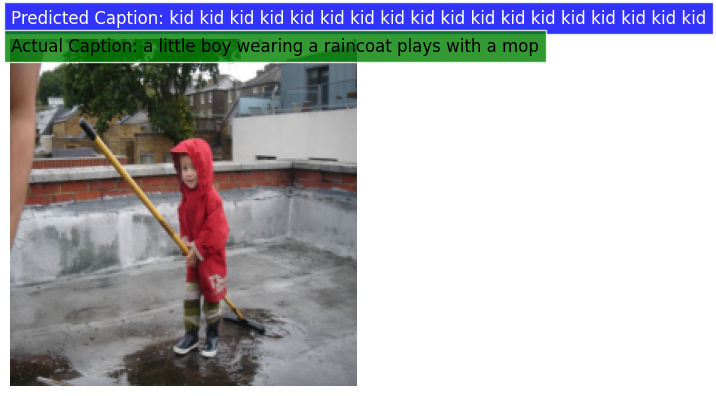

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_captions(image, predicted_caption, real_caption):
    """Display an image with predicted and real captions."""
    
    # Denormalize the image tensor
    image[0] = image[0] * 0.229
    image[1] = image[1] * 0.224
    image[2] = image[2] * 0.225
    image[0] += 0.485
    image[1] += 0.456
    image[2] += 0.406
    
    # Convert the image tensor to a numpy array and transpose the dimensions
    image = image.numpy().transpose((1, 2, 0))
    
    # Display the image
    plt.imshow(image)
    
    # Add predicted caption box
    plt.text(
        0, -20, predicted_caption, color='white', backgroundcolor='blue',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='blue', alpha=0.8, edgecolor='white', pad=5)
    )
    
    # Add real caption box
    plt.text(
        0, -2, real_caption, color='black', backgroundcolor='green',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='green', alpha=0.8, edgecolor='white', pad=5)
    )
    
    plt.axis('off')
    plt.tight_layout()

# Define the test data transformations
test_transforms = T.Compose([
    T.Resize((224, 224)),  # Resize the images to the specified size
    T.ToTensor(),  # Convert the images to tensors
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # Normalize the image tensors
])

# Create the test dataset
test_dataset = FlickrDataset(
    root_dir="Images",  # Root directory of the dataset
    caption_file="captions.txt",  # File containing the captions
    transform=test_transforms,  # Apply the specified transformations to the images
    frequency_threshold=1,  # Frequency threshold for filtering captions
    data_type='test'  # Specify the type of data (in this case, 'test')
)

# Create the test data loader
test_loader = DataLoader(
    dataset=test_dataset,  # Use the created test dataset
    batch_size=BATCH_SIZE,  # Number of samples per batch
    num_workers=NUM_WORKERS,  # Number of worker threads for data loading
    shuffle=True,  # Shuffle the data for each epoch
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)  # Function to collate and preprocess the data
)

# Get a batch of images and captions from the test loader
images, captions = next(iter(test_loader))

# Iterate over a single image and its captions
for i in range(1):
    # Set the model to evaluation mode
    NoFreeze_model_bi.eval()
    
    # Get a single test image and create a clone
    test_image = torch.clone(images)[i].unsqueeze(0)
    
    # Disable gradient calculation during inference
    with torch.no_grad():
        # Encode the test image using the model's encoder
        features = NoFreeze_model_bi.encoder(test_image[0:1].to(device))
        
        # Generate captions for the test image using the model's decoder
        predicted_captions = NoFreeze_model_bi.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
        
        # Get the ground truth caption for the test image
        cap = torch.clone(captions)[i]
        caption_label = [test_dataset.vocab.itos[token] for token in cap.tolist()]
        
        # Find the index of the end-of-sequence token '<EOS>' in the caption
        eos_index = caption_label.index('<EOS>')
        
        # Extract the caption tokens from the start to the '<EOS>' token
        caption_label = caption_label[1:eos_index]
        
        # Convert the caption tokens to a string
        caption_label = ' '.join(caption_label)
        
        # Create the predicted caption string with proper formatting
        predicted_caption = "Predicted Caption: " + ' '.join(predicted_captions[1:len(predicted_captions)-1])
        
        # Create the actual caption string with proper formatting
        real_caption = "Actual Caption: " + caption_label
        
        # Display the image with the predicted and real captions
        show_image_with_captions(test_image[0], predicted_caption, real_caption)

# Save the plot as a PDF file
plt.savefig("testimagecaptions31.pdf", format='pdf', bbox_inches='tight')


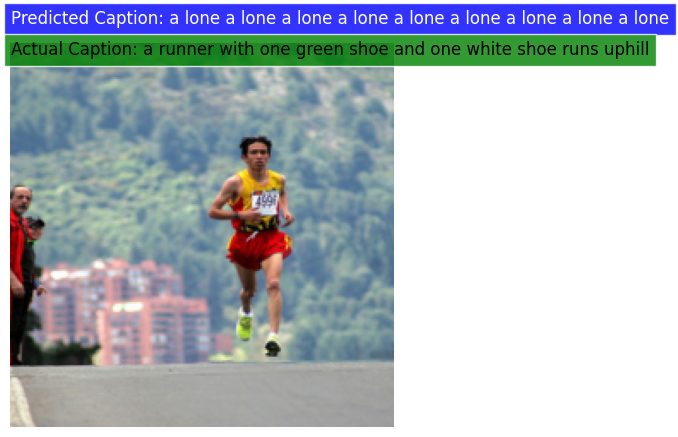

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_captions(image, predicted_caption, real_caption):
    """Display an image with predicted and real captions."""
    
    # Denormalize the image tensor
    image[0] = image[0] * 0.229
    image[1] = image[1] * 0.224
    image[2] = image[2] * 0.225
    image[0] += 0.485
    image[1] += 0.456
    image[2] += 0.406
    
    # Convert the image tensor to a numpy array and transpose the dimensions
    image = image.numpy().transpose((1, 2, 0))
    
    # Display the image
    plt.imshow(image)
    
    # Add predicted caption box
    plt.text(
        0, -20, predicted_caption, color='white', backgroundcolor='blue',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='blue', alpha=0.8, edgecolor='white', pad=5)
    )
    
    # Add real caption box
    plt.text(
        0, -2, real_caption, color='black', backgroundcolor='green',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='green', alpha=0.8, edgecolor='white', pad=5)
    )
    
    plt.axis('off')
    plt.tight_layout()

# Define the test data transformations
test_transforms = T.Compose([
    T.Resize((224, 224)),  # Resize the images to the specified size
    T.ToTensor(),  # Convert the images to tensors
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # Normalize the image tensors
])

# Create the test dataset
test_dataset = FlickrDataset(
    root_dir="Images",  # Root directory of the dataset
    caption_file="captions.txt",  # File containing the captions
    transform=test_transforms,  # Apply the specified transformations to the images
    frequency_threshold=1,  # Frequency threshold for filtering captions
    data_type='test'  # Specify the type of data (in this case, 'test')
)

# Create the test data loader
test_loader = DataLoader(
    dataset=test_dataset,  # Use the created test dataset
    batch_size=BATCH_SIZE,  # Number of samples per batch
    num_workers=NUM_WORKERS,  # Number of worker threads for data loading
    shuffle=True,  # Shuffle the data for each epoch
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)  # Function to collate and preprocess the data
)

# Get a batch of images and captions from the test loader
images, captions = next(iter(test_loader))

# Iterate over a single image and its captions
for i in range(1):
    # Set the model to evaluation mode
    NoFreeze_model_bi.eval()
    
    # Get a single test image and create a clone
    test_image = torch.clone(images)[i].unsqueeze(0)
    
    # Disable gradient calculation during inference
    with torch.no_grad():
        # Encode the test image using the model's encoder
        features = NoFreeze_model_bi.encoder(test_image[0:1].to(device))
        
        # Generate captions for the test image using the model's decoder
        predicted_captions = NoFreeze_model_bi.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
        
        # Get the ground truth caption for the test image
        cap = torch.clone(captions)[i]
        caption_label = [test_dataset.vocab.itos[token] for token in cap.tolist()]
        
        # Find the index of the end-of-sequence token '<EOS>' in the caption
        eos_index = caption_label.index('<EOS>')
        
        # Extract the caption tokens from the start to the '<EOS>' token
        caption_label = caption_label[1:eos_index]
        
        # Convert the caption tokens to a string
        caption_label = ' '.join(caption_label)
        
        # Create the predicted caption string with proper formatting
        predicted_caption = "Predicted Caption: " + ' '.join(predicted_captions[1:len(predicted_captions)-1])
        
        # Create the actual caption string with proper formatting
        real_caption = "Actual Caption: " + caption_label
        
        # Display the image with the predicted and real captions
        show_image_with_captions(test_image[0], predicted_caption, real_caption)

# Save the plot as a PDF file
plt.savefig("testimagecaptions32.pdf", format='pdf', bbox_inches='tight')


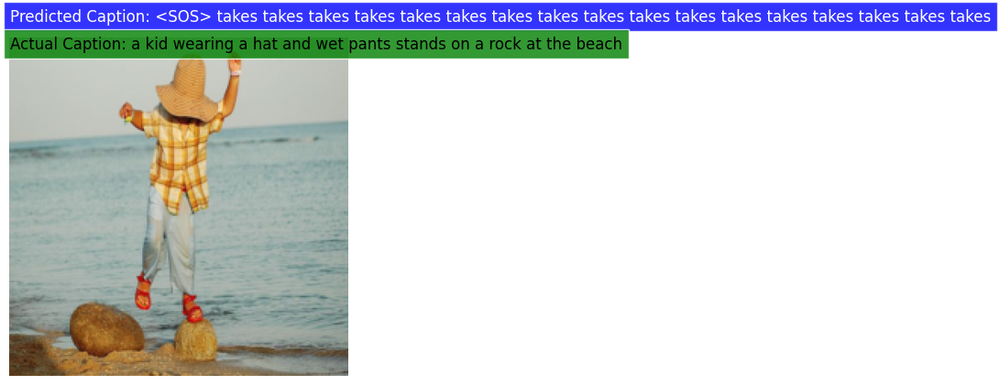

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_captions(image, predicted_caption, real_caption):
    """Display an image with predicted and real captions."""
    
    # Denormalize the image tensor
    image[0] = image[0] * 0.229
    image[1] = image[1] * 0.224
    image[2] = image[2] * 0.225
    image[0] += 0.485
    image[1] += 0.456
    image[2] += 0.406
    
    # Convert the image tensor to a numpy array and transpose the dimensions
    image = image.numpy().transpose((1, 2, 0))
    
    # Display the image
    plt.imshow(image)
    
    # Add predicted caption box
    plt.text(
        0, -20, predicted_caption, color='white', backgroundcolor='blue',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='blue', alpha=0.8, edgecolor='white', pad=5)
    )
    
    # Add real caption box
    plt.text(
        0, -2, real_caption, color='black', backgroundcolor='green',
        fontsize=12, verticalalignment='top', bbox=dict(facecolor='green', alpha=0.8, edgecolor='white', pad=5)
    )
    
    plt.axis('off')
    plt.tight_layout()

# Define the test data transformations
test_transforms = T.Compose([
    T.Resize((224, 224)),  # Resize the images to the specified size
    T.ToTensor(),  # Convert the images to tensors
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # Normalize the image tensors
])

# Create the test dataset
test_dataset = FlickrDataset(
    root_dir="Images",  # Root directory of the dataset
    caption_file="captions.txt",  # File containing the captions
    transform=test_transforms,  # Apply the specified transformations to the images
    frequency_threshold=1,  # Frequency threshold for filtering captions
    data_type='test'  # Specify the type of data (in this case, 'test')
)

# Create the test data loader
test_loader = DataLoader(
    dataset=test_dataset,  # Use the created test dataset
    batch_size=BATCH_SIZE,  # Number of samples per batch
    num_workers=NUM_WORKERS,  # Number of worker threads for data loading
    shuffle=True,  # Shuffle the data for each epoch
    collate_fn=Apppadd(pad_idx=pad_idx, batch_first=True)  # Function to collate and preprocess the data
)

# Get a batch of images and captions from the test loader
images, captions = next(iter(test_loader))

# Iterate over a single image and its captions
for i in range(1):
    # Set the model to evaluation mode
    NoFreeze_model_bi.eval()
    
    # Get a single test image and create a clone
    test_image = torch.clone(images)[i].unsqueeze(0)
    
    # Disable gradient calculation during inference
    with torch.no_grad():
        # Encode the test image using the model's encoder
        features = NoFreeze_model_bi.encoder(test_image[0:1].to(device))
        
        # Generate captions for the test image using the model's decoder
        predicted_captions = NoFreeze_model_bi.decoder.generate_caption(features.unsqueeze(0), vocab=train_dataset.vocab)
        
        # Get the ground truth caption for the test image
        cap = torch.clone(captions)[i]
        caption_label = [test_dataset.vocab.itos[token] for token in cap.tolist()]
        
        # Find the index of the end-of-sequence token '<EOS>' in the caption
        eos_index = caption_label.index('<EOS>')
        
        # Extract the caption tokens from the start to the '<EOS>' token
        caption_label = caption_label[1:eos_index]
        
        # Convert the caption tokens to a string
        caption_label = ' '.join(caption_label)
        
        # Create the predicted caption string with proper formatting
        predicted_caption = "Predicted Caption: " + ' '.join(predicted_captions[1:len(predicted_captions)-1])
        
        # Create the actual caption string with proper formatting
        real_caption = "Actual Caption: " + caption_label
        
        # Display the image with the predicted and real captions
        show_image_with_captions(test_image[0], predicted_caption, real_caption)

# Save the plot as a PDF file
plt.savefig("testimagecaptions33.pdf", format='pdf', bbox_inches='tight')
